### Data importation

In [1]:
import numpy as np
import torch 
import networkx as nx
import os

from framework.utils import read_matrix_from_csv_loadtxt, compute_node_feature_assortativity

datasetPath = "data/France/transportsIDF/"


p_vectors_array = read_matrix_from_csv_loadtxt(datasetPath + "idf_attr_nnorm.csv")
adjacency_matrix = read_matrix_from_csv_loadtxt(datasetPath + "idf_adjacency_nnorm.csv")
names = read_matrix_from_csv_loadtxt(datasetPath + "idf_names_nnorm.csv", dtype=str)
num_nodes = adjacency_matrix.shape[0]
dimP = 20

G = nx.from_numpy_array(adjacency_matrix)
G.remove_edges_from(nx.selfloop_edges(G)) # Remove self-loops

distance_mode = "dijkstra"
node_scores_1 = compute_node_feature_assortativity(G, p_vectors_array)

cols_names = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:128: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: dlopen(/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so, 0x0006): Symbol not found: __ZN2at4_ops16div__Tensor_mode4callERNS_6TensorERKS2_NSt3__18optionalINS6_17basic_string_viewIcNS6_11char_traitsIcEEEEEE
  Referenced from: <2BF76774-0954-3F15-B7FE-8A5E5111D7DF> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so
  Expected in:     <A51C8C05-245A-3989-8D3C-9A6704422CA5> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:166: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/

Successfully loaded matrix from data/France/transportsIDF/idf_attr_nnorm.csv using np.loadtxt().
Successfully loaded matrix from data/France/transportsIDF/idf_adjacency_nnorm.csv using np.loadtxt().
Successfully loaded matrix from data/France/transportsIDF/idf_names_nnorm.csv using np.loadtxt().


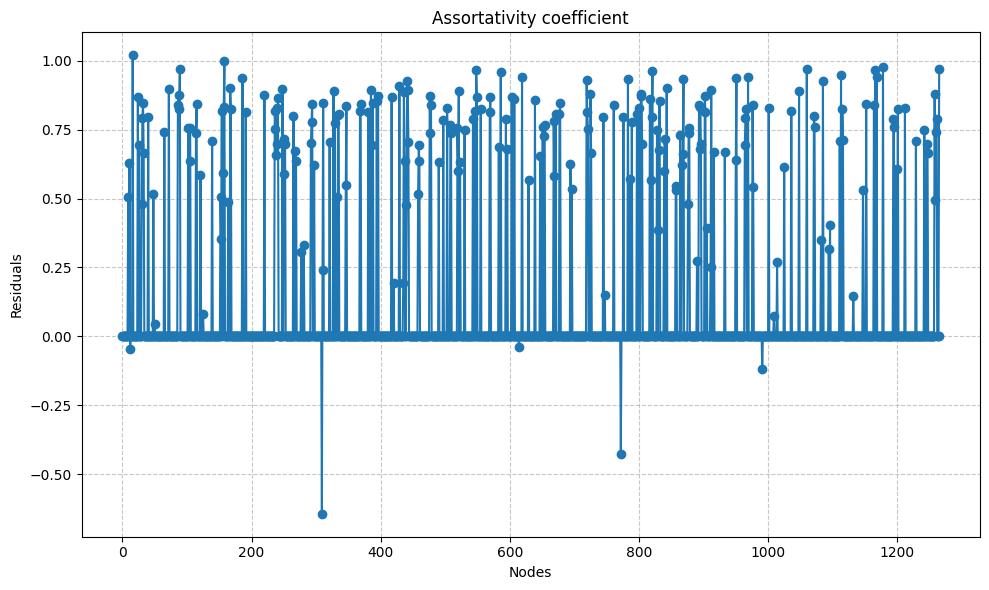

In [2]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6)) # Set the size of the plot for better readability

plt.plot(node_scores_1.values(), marker='o', linestyle='-')

# Add a horizontal line at y=0

# --- Customize the Plot ---
plt.xlabel('Nodes') # Label for the x-axis
plt.ylabel('Residuals') # Label for the y-axis, updated to reflect the ratio
plt.title('Assortativity coefficient') # Title of the plot, updated
plt.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping
plt.show()

### Phase 1

In [3]:
from framework.trainFct import *
from torch_geometric.data import Data
from framework.visuals import *

latent_dim = 2
input_dim = dimP
batch_size = 256
dropout = 0
phase1_epochs = 1200
phase2_epochs = 500
lr_phase1 = 0.001
latent_dim = 2
device = "cuda" if torch.cuda.is_available() else "cpu"

dataset = []
data = Data(x=torch.tensor(p_vectors_array, dtype=torch.float), 
            edge_index=adj_matrix_to_edge_index(adjacency_matrix)[0], 
            edge_labels=adj_matrix_to_edge_index(adjacency_matrix)[1],
            adjacency_matrix=torch.tensor(adjacency_matrix))
dataset.append(data)

single_graph = dataset[0]
single_graph_list = [single_graph]

encoder = MLPEncoder(
    input_dim=input_dim,
    hidden_dims=[96, 64],
    latent_dim=latent_dim,
    mlp_layers=2,
    dropout=0.2,
    activation=nn.ReLU()
)

node_decoder = NodeAttributeVariationalDecoder(
    latent_dim=latent_dim,
    output_dim=input_dim,
    #hidden_dims=[5000, 128],
    #hidden_dims=[2000, 128],
    hidden_dims=[128],
    dropout=dropout,
    activation=nn.ReLU(),
    loss_options= {
        "lambda_comp_variance": 100,
        "lambda_decoder_variance":20,
        "debug": False},
    clip_var = 30,
)

kl_scheduler = KLAnnealingScheduler(
    anneal_start=0.0,
    anneal_end=1,
    anneal_steps=phase1_epochs * len(single_graph_list),
    anneal_type='sigmoid',
)

# Create initial model with only node decoder
model_phase1 = GraphVAE(
    encoder=encoder,
    decoders=[node_decoder],
    kl_scheduler=kl_scheduler,
    compute_latent_manifold=False,
)


Loading pretrained model


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_95593/595956709.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_phase1.load_state_dict(torch.load('model

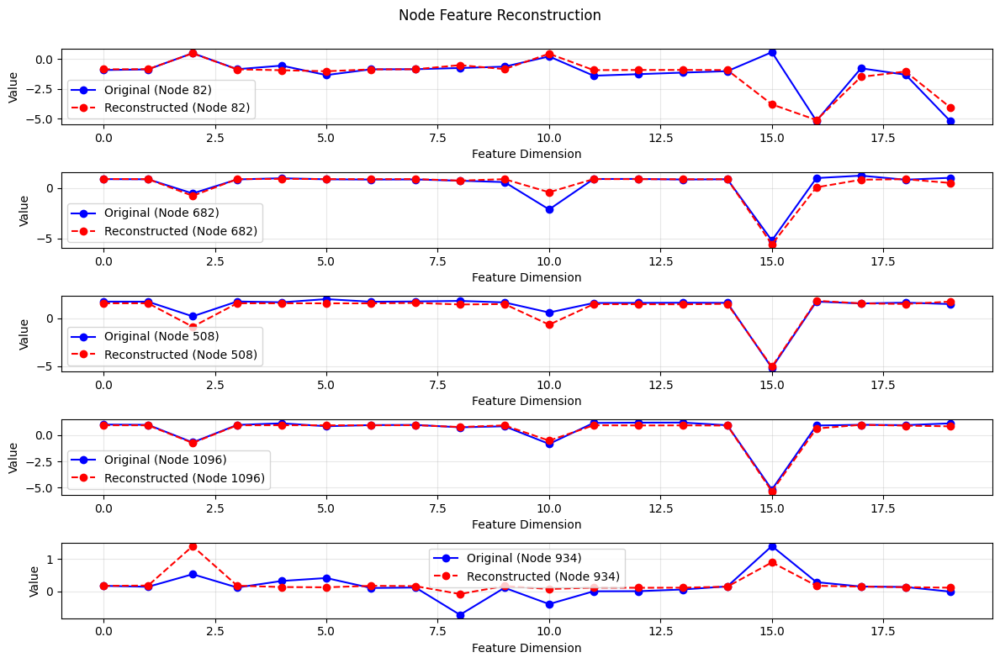

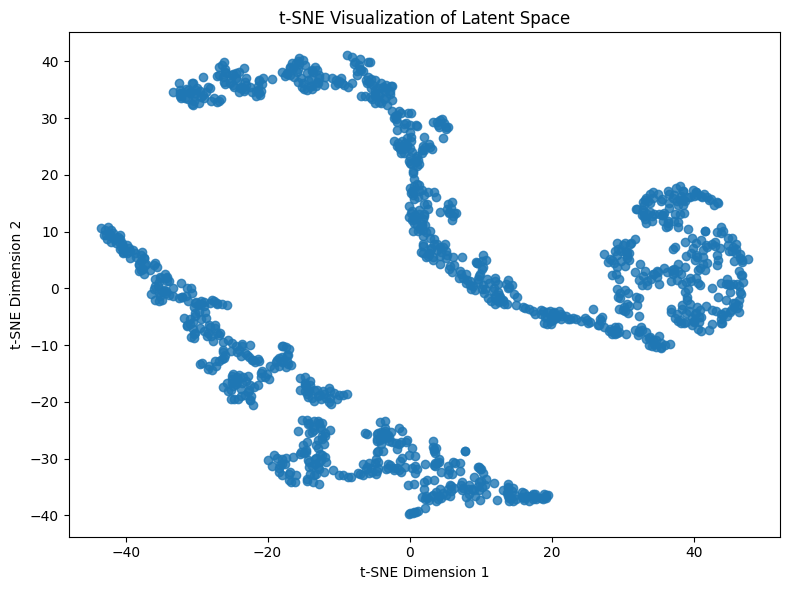

In [4]:
if os.path.exists("model_phase1_IDF.pth"):
    print("Loading pretrained model")
    model_phase1.load_state_dict(torch.load('model_phase1_IDF.pth'))
else:
    print("=== Starting Phase 1: Training encoder with node feature reconstruction ===")

    # Phase 1 training
    history_phase1 = train_phase1(
        model=model_phase1,
        data_loader=single_graph_list,
        num_epochs=phase1_epochs,
        lr=lr_phase1,
        weight_decay=1e-5,
        verbose=True,
        device=device,
        loss_coefficient=1
    )

    print("\n=== Phase 1 Complete ===")

    torch.save(model_phase1.state_dict(), 'model_phase1_IDF.pth')
    print("\n=== Phase 1 Saved ===")

    visualize_training(history_phase1)
visualize_node_features_reconstruction(model_phase1, single_graph, sample_features=dimP)
visualize_latent_space(model_phase1, [single_graph])


Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7528.18it/s]


Completed. Cached 10201 / 10201 points.


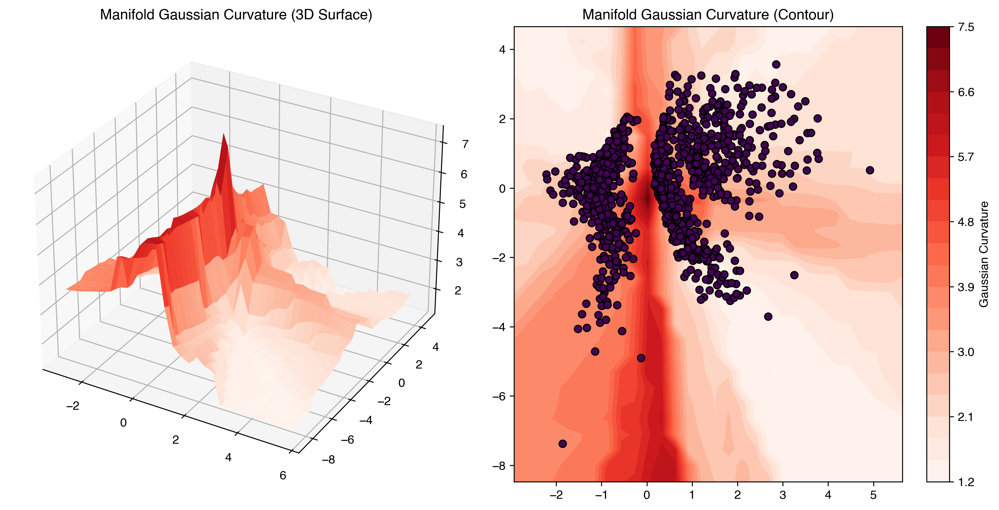

Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/1266 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/8825 [00:00<?, ?it/s]

Pathfinding (Threaded Dijkstra):   0%|          | 0/1266 [00:00<?, ?it/s]

Recomputing distances:   0%|          | 0/802011 [00:00<?, ?it/s]

In [5]:
import copy
from framework.boundedManifold import BoundedManifold
from framework.torchVersions.distanceApproximations import DistanceApproximations
model_phase1 = model_phase1.to('cpu')
model_phase2 = copy.deepcopy(model_phase1)

model_phase1.eval()

with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu = model_phase1.encode(x, edge_index=edge_index)

latent_points = latent_mu[0]

model_phase1.set_compute_latent_manifold(True)
model_phase1.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase1.get_latent_manifold().compute_full_grid_metric_tensor()
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points)

with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase1 = model_phase1.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase1 = model_phase1.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )


### Phase 2

In [6]:
from framework.KLAnnealingScheduler import NoKLScheduler

print("=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===")

model_phase2.set_compute_latent_manifold(True)
model_phase2.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase2.set_encoder_freeze(True)

#torch.autograd.set_detect_anomaly(True)

distance_decoder = ManifoldHeatKernelDecoder(
    distance_mode=distance_mode,
    latent_dim=latent_dim,
    num_eigenvalues=500,
    num_integration_points=20,
    name="adj_decoder",
    max_ema_epochs=phase2_epochs,
)

model_phase2.add_decoder(distance_decoder)
model_phase2.get_decoder("adj_decoder").giveVAEInstance(model_phase2)
model_phase2.kl_scheduler = NoKLScheduler()

torch.nn.utils.clip_grad_norm_(model_phase2.parameters(), 1)


if os.path.exists("model_phase2_IDF_"+ distance_mode + ".pth"):
    print("Loading pretrained model")
    model_phase2.load_state_dict(torch.load('model_phase2_IDF_'+ distance_mode + '.pth'))
else:
    # Phase 2 training
    history_phase2 = train_phase2(
        model=model_phase2,
        data_loader=single_graph_list,
        latent_points=latent_points,
        num_epochs=phase2_epochs,
        lr=lr_phase2,
        weight_decay=1e-5,
    #    decoder_weights={"adj_decoder": -1, "node_attr_decoder":-1 },
        decoder_weights={"adj_decoder": 1, "node_attr_decoder":0.0 },
        verbose=True,
        device=device,
    )

    print("\n=== Phase 2 Complete ===")



=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===
Loading pretrained model


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_95593/4239534825.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_phase2.load_state_dict(torch.load('mod

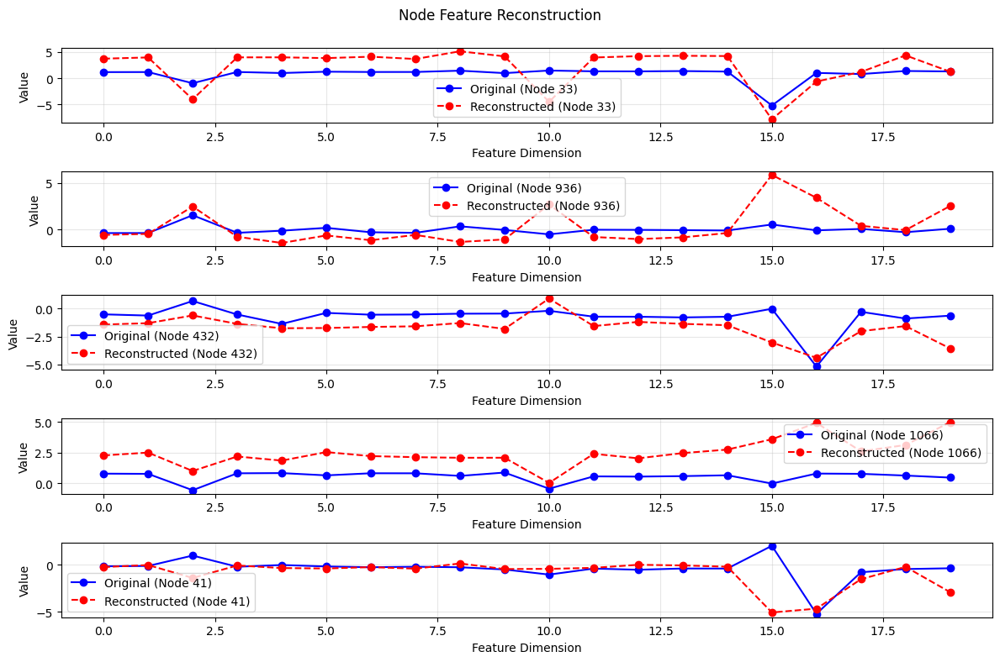

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 7647.48it/s]


Completed. Cached 10201 / 10201 points.


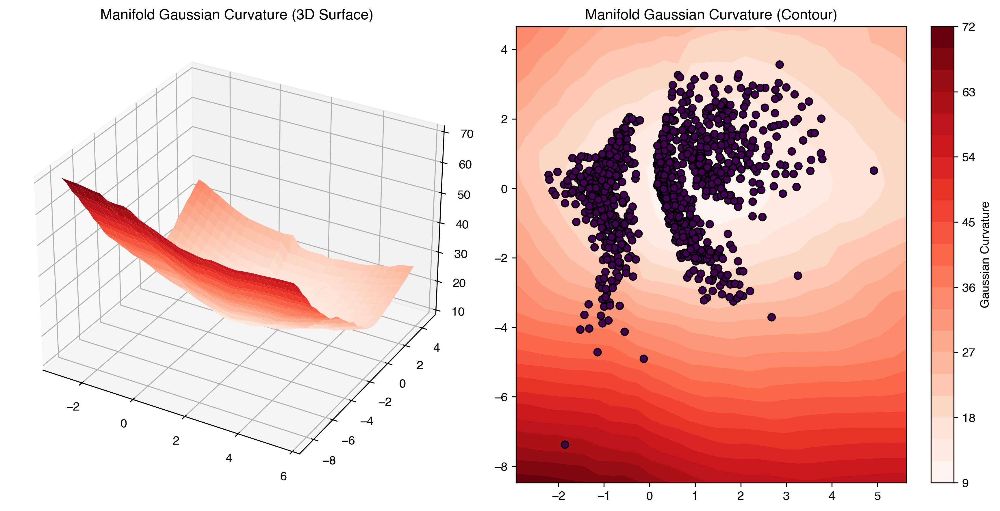

In [7]:
visualize_node_features_reconstruction(model_phase2, single_graph, sample_features=dimP)
with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu2 = model_phase2.encode(x, edge_index=edge_index)

curv_phase2 = model_phase2.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0], exact_mode=False, return_data=True)

In [8]:
with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase2 = model_phase2.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase2 = model_phase2.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )
        

Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/1266 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/8825 [00:00<?, ?it/s]

Pathfinding (Threaded Dijkstra):   0%|          | 0/1266 [00:01<?, ?it/s]

Recomputing distances:   0%|          | 0/802011 [00:00<?, ?it/s]

Full grid already computed for current epoch.
Full grid already computed for current epoch.


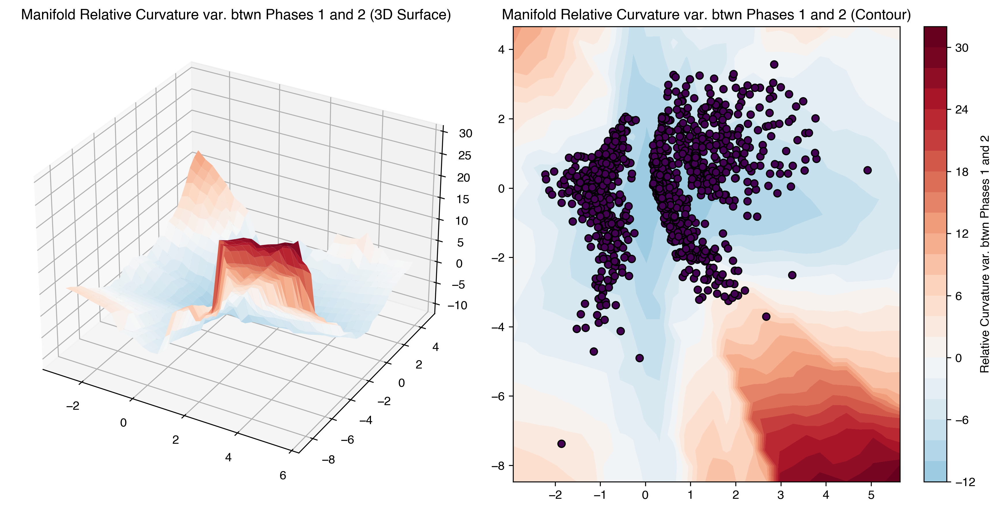

In [9]:
from framework.utils import compute_curvature_change
curvature_diff, Z1_np, Z2_np = compute_curvature_change(model_phase1, model_phase2)
model_phase2.get_latent_manifold()._plot_manifold_grid(curvature_diff, Z1_np, Z2_np, latent_points=latent_points, name="Relative Curvature var. btwn Phases 1 and 2")

In [10]:
from scipy.stats import median_abs_deviation

if isinstance(dists_phase1, torch.Tensor):
    dists_phase1 = dists_phase1.detach().numpy()
if isinstance(dists_phase2, torch.Tensor):
    dists_phase2 = dists_phase2.detach().numpy()

res = np.abs((dists_phase1 - dists_phase2))
res3 = ((dists_phase2 - dists_phase1)/dists_phase1)
res3 = np.nan_to_num(res3, 0)

res3_z = (res3 - np.mean(res3))/np.sqrt(np.var(res3))
res3_zc = (res3 - np.median(res3))/median_abs_deviation(res3)



/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_95593/2363762982.py:9: RuntimeWarning: invalid value encountered in divide
  res3 = ((dists_phase2 - dists_phase1)/dists_phase1)


#### Analysis via position

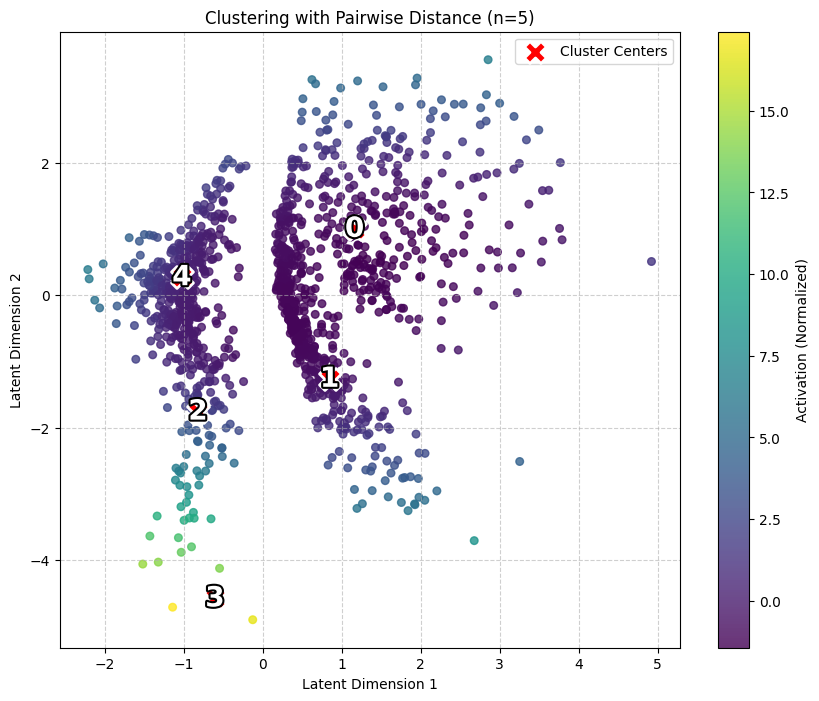

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe # Import for text outline
from sklearn.cluster import AgglomerativeClustering
from scipy.stats import median_abs_deviation

# Assuming the following are defined:
# latent_points: (N, 2) array
# res3: (N, M) array used for activation calculation
# dists_phase1: (N, N) pairwise distance matrix

# --- DATA PREP ---
res_3_log = np.log(res3 + 1e-4)

# 1. Define Mask
mask = latent_points[:, 1] > -6
#mask = latent_points[:, 1] > -60

# 2. Apply mask to data
# We assume res_3 was meant to be the distance matrix or similar for the ix_ slice, 
# but based on your previous logic, we likely want to mask the ACTIVATIONS vector.
# This logic aligns 'activations' with 'latent_points_clean'
activations_raw = res_3_log.sum(axis=1).flatten()
activations_clean = activations_raw[mask]

# Normalize activations for cleaner coloring
activations_clean = (activations_clean - np.median(activations_clean)) / median_abs_deviation(activations_clean) #np.sqrt(np.var(activations_clean))

latent_points_clean = latent_points[mask]

# 3. Apply mask to the Pairwise Distance Matrix
dist_matrix_clean = dists_phase1[np.ix_(mask, mask)]

# --- CLUSTERING ---
n_clusters = 5
cluster_model = AgglomerativeClustering(
    n_clusters=n_clusters, 
    metric='precomputed', 
    linkage='average'
)
labels = cluster_model.fit_predict(dist_matrix_clean)

# Calculate "Pseudo-Centroids" (2D Mean)
centroids_2d = []
for i in range(n_clusters):
    cluster_points = latent_points_clean[labels == i]
    centroids_2d.append(cluster_points.mean(axis=0))
centroids_2d = np.array(centroids_2d)

# --- PLOTTING ---
plt.figure(figsize=(10, 8))

# 4. Plot points colored by ACTIVATION
sc = plt.scatter(latent_points_clean[:, 0], latent_points_clean[:, 1], 
                 c=activations_clean, cmap='viridis', alpha=0.8, s=30)

# 5. Overlay Cluster Centers
plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1], c='red', s=250, marker='X', 
            linewidths=2, edgecolors='white', label='Cluster Centers')

# 6. NEW: Add Cluster Numbers
for i in range(n_clusters):
    plt.text(centroids_2d[i, 0], centroids_2d[i, 1], str(i), 
             fontsize=20, color='white', weight='bold',
             ha='center', va='center',
             path_effects=[pe.withStroke(linewidth=3, foreground='black')])

plt.colorbar(sc, label='Activation (Normalized)')
plt.title(f'Clustering with Pairwise Distance (n={n_clusters})')
plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.6)

plt.savefig('clustering_precomputed_numbered.png')
plt.show()

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.patheffects as pe
from sklearn.cluster import AgglomerativeClustering
from scipy.stats import median_abs_deviation
from scipy.spatial import ConvexHull
from scipy.spatial import Delaunay
from matplotlib.collections import LineCollection

from scipy.spatial import Delaunay
from collections import Counter

def plot_alpha_shape(ax, points, alpha_val, color='k'):
    """
    Plots the boundary of the alpha shape (concave hull).
    """
    # 1. SPECIAL CASE: Triangle (3 points)
    # Just draw a simple polygon around them, ignoring alpha threshold
    if len(points) == 3:
        # Close the loop
        closed_loop = np.vstack([points, points[0]])
        ax.plot(closed_loop[:, 0], closed_loop[:, 1], 
                color=color, linestyle='--', linewidth=2.5, alpha=0.8)
        return

    # 2. STANDARD CASE: 4+ points (Alpha Shape)
    if len(points) < 4: 
        return # Cannot draw a polygon with < 3 points

    tri = Delaunay(points)
    edges_counter = Counter()

    for ia, ib, ic in tri.simplices:
        pa = points[ia]
        pb = points[ib]
        pc = points[ic]
        
        # Calculate Circumradius
        a = np.linalg.norm(pa - pb)
        b = np.linalg.norm(pb - pc)
        c = np.linalg.norm(pc - pa)
        s = (a + b + c) / 2.0
        area = np.sqrt(max(s * (s - a) * (s - b) * (s - c), 1e-9))
        
        if area > 0:
            circum_r = (a * b * c) / (4.0 * area)
            
            # Filter: If triangle is small enough, keep its edges
            if circum_r < 1.0 / alpha_val:
                edges_counter[tuple(sorted((ia, ib)))] += 1
                edges_counter[tuple(sorted((ib, ic)))] += 1
                edges_counter[tuple(sorted((ic, ia)))] += 1

    # Draw only BOUNDARY edges (count == 1)
    boundary_edges = []
    for (i, j), count in edges_counter.items():
        if count == 1:
            boundary_edges.append(points[[i, j]])

    if boundary_edges:
        lc = LineCollection(boundary_edges, colors=color, 
                            linestyles='--', linewidths=2.5, alpha=0.8)
        ax.add_collection(lc)

def plot_merged_manifold_clusters(curvature_np, Z1_np, Z2_np, 
                                  latent_points, res3, dists_phase1, 
                                  name='Curvature', graphs=3, 
                                  only_merged=False, draw_boundaries=True,
                                  bg_alpha=1.0): # <--- NEW PARAMETER (Default 1.0 = Opaque)
    
    # --- 1. DATA PREP & CLUSTERING ---
    values = curvature_np
    if isinstance(values, torch.Tensor): values = values.detach().cpu().numpy()
    if isinstance(latent_points, torch.Tensor): latent_points = latent_points.detach().cpu().numpy()

    # Calculate Activations
    res_3_log = np.log(res3 + 1e-4)
    activations_raw = res_3_log.sum(axis=1).flatten()

    mask = latent_points[:, 1] > -6
    activations_clean = activations_raw[mask]
    latent_points_clean = latent_points[mask]
    dist_matrix_clean = dists_phase1[np.ix_(mask, mask)]

    # Normalize Activations
    if len(activations_clean) > 0:
        activations_clean = (activations_clean - np.median(activations_clean)) / (median_abs_deviation(activations_clean) + 1e-6)

    # Perform Clustering
    n_clusters = 5
    if len(latent_points_clean) >= n_clusters:
        cluster_model = AgglomerativeClustering(n_clusters=n_clusters, metric='precomputed', linkage='average')
        labels = cluster_model.fit_predict(dist_matrix_clean)
        
        centroids_2d = []
        for i in range(n_clusters):
            centroids_2d.append(latent_points_clean[labels == i].mean(axis=0))
        centroids_2d = np.array(centroids_2d)
    else:
        labels = np.zeros(len(latent_points_clean))
        centroids_2d = np.array([])

    # --- 2. PLOT SETUP ---
    with plt.rc_context({'font.family': 'sans-serif', 'font.sans-serif': ['Helvetica', 'Arial', 'DejaVu Sans']}):
        
        if only_merged:
            fig = plt.figure(figsize=(10, 8), dpi=300)
        else:
            fig = plt.figure(figsize=(18 if graphs > 2 else 12, 6), dpi=300)
        
        vmin, vmax = np.nanmin(values), np.nanmax(values)
        if np.isnan(vmin) or np.isnan(vmax) or vmin == vmax: vmin, vmax = -1, 1
        
        if vmin < 0 and vmax > 0:
            absmax = np.max([np.abs(vmax), np.abs(vmin)])
            norm = colors.TwoSlopeNorm(vmin=-absmax, vcenter=0, vmax=absmax)
            cmap = 'RdBu_r'
        elif vmin < 0 and vmax <= 0:
            norm = colors.Normalize(vmin=vmin, vmax=vmax)
            cmap = 'Blues_r'
        else:
            norm = colors.Normalize(vmin=vmin, vmax=vmax)
            cmap = 'Reds'

        # --- 3. PLOTTING SUBPLOTS ---
        if not only_merged:
            if graphs > 2:
                ax1 = fig.add_subplot(131)
                im = ax1.pcolormesh(Z1_np, Z2_np, values, cmap=cmap, norm=norm, shading='auto')
                ax1.set_title(f'{name} (2D Map)')
                plt.colorbar(im, ax=ax1, label=f'{name} Value')

            ax2 = fig.add_subplot(132 if graphs > 2 else 121, projection='3d')
            ax2.plot_surface(Z1_np, Z2_np, values, cmap=cmap, norm=norm, alpha=0.8)
            ax2.set_title(f'{name} (3D Surface)')

        if only_merged:
            ax_merged = fig.add_subplot(111)
        else:
            ax_merged = fig.add_subplot(133 if graphs > 2 else 122)

        # --- 4. THE MERGED PLOT ---
        
        # Layer 1: Background Contours (Manifold)
        # Using bg_alpha here. Set to 1.0 for solid colors.
        contour = ax_merged.contourf(Z1_np, Z2_np, values, 20, cmap=cmap, norm=norm, alpha=bg_alpha)
        
        # Layer 1.5: Cluster Boundaries (Convex Hulls)
        # if draw_boundaries and len(latent_points_clean) > n_clusters:
        #     for i in range(n_clusters):
        #         points = latent_points_clean[labels == i]
        #         if len(points) >= 3:
        #             try:
        #                 hull = ConvexHull(points)
        #                 hull_points = points[hull.vertices]
        #                 hull_points = np.append(hull_points, [hull_points[0]], axis=0)
                        
        #                 ax_merged.plot(hull_points[:, 0], hull_points[:, 1], 
        #                                color='black', linestyle='--', linewidth=2, alpha=0.8)
        #             except:
        #                 pass

        if draw_boundaries and len(latent_points_clean) > n_clusters:
            for i in range(n_clusters):
                cluster_pts = latent_points_clean[labels == i]
                
                # --- TUNING TIP ---
                # alpha_val=0.8 is a good starting point for your coordinate range (-5 to 5).
                # If the boundary looks "shattered" (too many small islands), LOWER it to 0.4 or 0.5.
                # If the boundary is still crossing over other clusters, INCREASE it to 1.0 or 1.2.
                plot_alpha_shape(ax_merged, cluster_pts, alpha_val=0.7)

        # Layer 2: Scatter Points
        sc = ax_merged.scatter(latent_points_clean[:, 0], latent_points_clean[:, 1], 
                               c=activations_clean, cmap='viridis', 
                               edgecolors='k', linewidth=0.3, alpha=0.9, s=40)
        
        # Layer 3: Centroids & Labels
        if len(centroids_2d) > 0:
            ax_merged.scatter(centroids_2d[:, 0], centroids_2d[:, 1], 
                              c='red', s=250, marker='X', linewidths=2, edgecolors='white', zorder=10)
            for i in range(n_clusters):
                ax_merged.text(centroids_2d[i, 0], centroids_2d[i, 1], str(i), 
                               fontsize=18, color='white', weight='bold', ha='center', va='center',
                               path_effects=[pe.withStroke(linewidth=3, foreground='black')], zorder=11)

        ax_merged.set_title(f'{name} Manifold w/ Clusters')
        
        cbar_con = plt.colorbar(contour, ax=ax_merged, fraction=0.046, pad=0.04)
        cbar_con.set_label(f'Background: {name}', rotation=270, labelpad=15)
        
        if only_merged:
             cbar_sc = plt.colorbar(sc, ax=ax_merged, fraction=0.046, pad=0.1, location='bottom')
             cbar_sc.set_label('Point Activation Intensity', rotation=0)

        plt.tight_layout()
        plt.show()

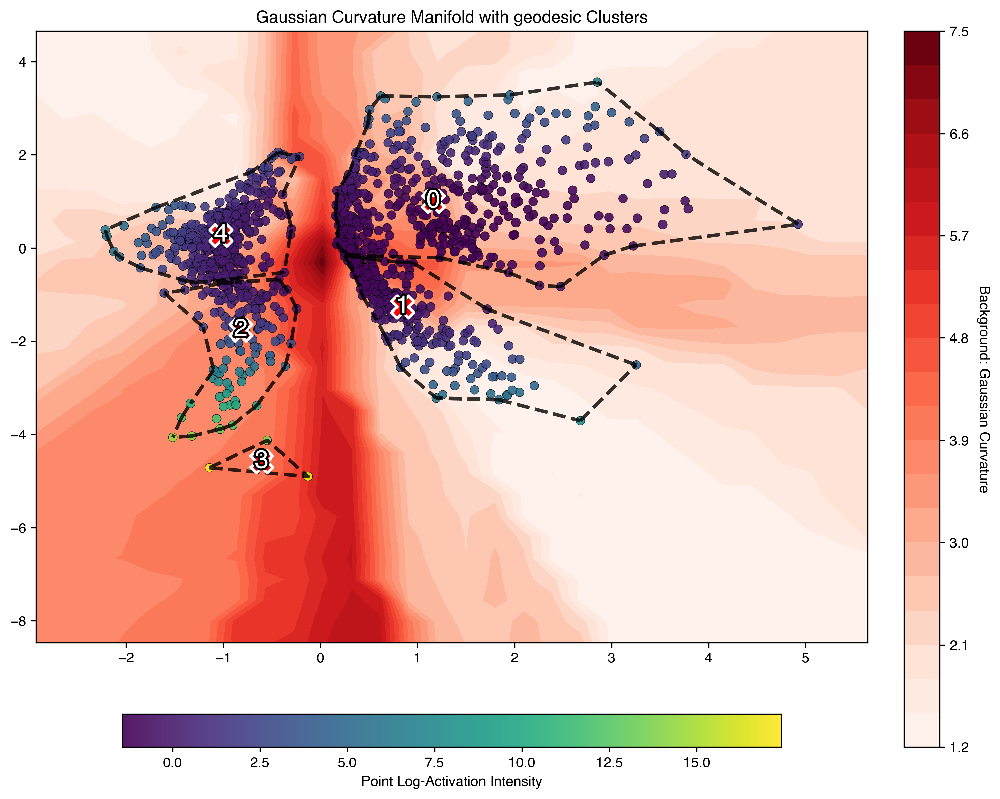

In [49]:
curvature_np = model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, plot=False, return_data=True)
plot_merged_manifold_clusters(curvature_np, Z1_np, Z2_np, latent_points, res3, dists_phase1, name='Gaussian Curvature', only_merged=True)

In [98]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.patheffects as pe
from matplotlib.collections import LineCollection
from matplotlib.gridspec import GridSpec
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.stats import median_abs_deviation
from scipy.spatial import Delaunay
from collections import Counter
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- HELPER: ALPHA SHAPE ---
def plot_alpha_shape(ax, points, alpha_val, color='k'):
    if len(points) == 3: 
        loop = np.vstack([points, points[0]])
        ax.plot(loop[:, 0], loop[:, 1], color=color, linestyle='--', linewidth=2.5, alpha=0.8)
        return
    if len(points) < 4: return 

    tri = Delaunay(points)
    edges = Counter()
    for ia, ib, ic in tri.simplices:
        pa, pb, pc = points[ia], points[ib], points[ic]
        a, b, c = np.linalg.norm(pa - pb), np.linalg.norm(pb - pc), np.linalg.norm(pc - pa)
        s = (a + b + c) / 2.0
        area = np.sqrt(max(s * (s - a) * (s - b) * (s - c), 1e-9))
        if area > 0 and (a * b * c) / (4.0 * area) < 1.0 / alpha_val:
            edges[tuple(sorted((ia, ib)))] += 1
            edges[tuple(sorted((ib, ic)))] += 1
            edges[tuple(sorted((ic, ia)))] += 1

    boundary = [points[[i, j]] for (i, j), c in edges.items() if c == 1]
    if boundary:
        ax.add_collection(LineCollection(boundary, colors=color, linestyles='--', linewidths=2.5, alpha=0.8))

# --- MAIN FUNCTION ---
def plot_merged_manifold_clusters(curvature_np, Z1_np, Z2_np, 
                                  latent_points, res3, dists_phase1, 
                                  name='Curvature', graphs=3, 
                                  only_merged=False, draw_boundaries=True,
                                  bg_alpha=1.0, n_clusters=5):
    
    # --- 1. DATA PREP ---
    values = curvature_np
    if isinstance(values, torch.Tensor): values = values.detach().cpu().numpy()
    if isinstance(latent_points, torch.Tensor): latent_points = latent_points.detach().cpu().numpy()

    res_3_log = np.log(res3 + 1e-4)
    activations_raw = res_3_log.sum(axis=1).flatten()

    mask = latent_points[:, 1] > -6
    activations_clean = activations_raw[mask]
    latent_points_clean = latent_points[mask]
    dist_matrix_clean = dists_phase1[np.ix_(mask, mask)]

    if len(activations_clean) > 0:
        activations_clean = (activations_clean - np.median(activations_clean)) / (median_abs_deviation(activations_clean) + 1e-6)

    # --- 2. SILHOUETTE ANALYSIS ---
    k_range = range(2, 11)
    sil_scores = []
    best_k_score = -1
    best_k = 2

    if len(latent_points_clean) > 10:
        for k in k_range:
            model_test = AgglomerativeClustering(n_clusters=k, metric='precomputed', linkage='average')
            lbls_test = model_test.fit_predict(dist_matrix_clean)
            score = silhouette_score(dist_matrix_clean, lbls_test, metric='precomputed')
            sil_scores.append(score)
            if score > best_k_score:
                best_k_score = score
                best_k = k
    else:
        sil_scores = [0] * len(k_range)

    # --- 3. FINAL CLUSTERING ---
    if len(latent_points_clean) >= n_clusters:
        cluster_model = AgglomerativeClustering(n_clusters=n_clusters, metric='precomputed', linkage='average')
        labels = cluster_model.fit_predict(dist_matrix_clean)
        
        centroids_2d = []
        for i in range(n_clusters):
            centroids_2d.append(latent_points_clean[labels == i].mean(axis=0))
        centroids_2d = np.array(centroids_2d)
    else:
        labels = np.zeros(len(latent_points_clean))
        centroids_2d = np.array([])

    # --- 4. PLOT SETUP ---
    with plt.rc_context({'font.family': 'sans-serif', 'font.sans-serif': ['Helvetica', 'Arial', 'DejaVu Sans']}):
        
        if only_merged:
            fig = plt.figure(figsize=(12, 12), dpi=300)
            gs = GridSpec(1, 2, width_ratios=[1, 4], figure=fig, wspace=0.15)
        else:
            fig = plt.figure(figsize=(18, 6), dpi=300)

        # Normalize Background
        vmin, vmax = np.nanmin(values), np.nanmax(values)
        if np.isnan(vmin) or np.isnan(vmax) or vmin == vmax: vmin, vmax = -1, 1
        absmax = np.max([np.abs(vmax), np.abs(vmin)])
        if vmin < 0 and vmax > 0:
            norm = colors.TwoSlopeNorm(vmin=-absmax, vcenter=0, vmax=absmax)
            cmap = 'RdBu_r'
        else:
            norm = colors.Normalize(vmin=vmin, vmax=vmax)
            cmap = 'Reds' if vmin >= 0 else 'Blues_r'

        # --- 5. PLOTTING ---

        # [PANEL A] The ROTATED Silhouette Score
        if only_merged:
            ax_sil = fig.add_subplot(gs[0])
            
            # Plot Data
            ax_sil.plot(sil_scores, k_range, marker='o', color='#333333', linewidth=1.5, markersize=6)
            
            # Highlight Optimal
            ax_sil.axhline(y=best_k, color='red', linestyle=':', alpha=0.6, label=f'Optimal k={best_k}')
            
            # Highlight Current
            if n_clusters != best_k:
                ax_sil.scatter([sil_scores[n_clusters-2]], [n_clusters], color='blue', s=100, zorder=5, label=f'Current k={n_clusters}')
            else:
                ax_sil.scatter([best_k_score], [best_k], color='red', s=100, zorder=5)

            ax_sil.set_title("Cluster Analysis", fontsize=10, weight='bold')
            ax_sil.set_xlabel("Silhouette Score", fontsize=9)
            ax_sil.set_ylabel("Number of Clusters (k)", fontsize=9)
            
            # --- 1. INVERT AXES ---
            ax_sil.invert_yaxis()  # Put k=2 at top
            ax_sil.invert_xaxis()  # Put Higher Scores on Left
            
            ax_sil.set_yticks(k_range)
            ax_sil.grid(True, linestyle='--', alpha=0.4)
            
            # --- 2. LEGEND INSIDE ---
            ax_sil.legend(fontsize=8, loc='best')
            
            ax_merged = fig.add_subplot(gs[1])
        else:
            ax_merged = fig.add_subplot(133 if graphs > 2 else 122)

        # [PANEL B] Manifold Map
        contour = ax_merged.contourf(Z1_np, Z2_np, values, 20, cmap=cmap, norm=norm, alpha=bg_alpha)
        
        if draw_boundaries and len(latent_points_clean) > n_clusters:
            for i in range(n_clusters):
                # Using 1.2 to keep boundaries tight
                plot_alpha_shape(ax_merged, latent_points_clean[labels == i], alpha_val=1.2)

        sc = ax_merged.scatter(latent_points_clean[:, 0], latent_points_clean[:, 1], 
                               c=activations_clean, cmap='viridis', 
                               edgecolors='k', linewidth=0.3, alpha=0.9, s=40)
        
        if len(centroids_2d) > 0:
            ax_merged.scatter(centroids_2d[:, 0], centroids_2d[:, 1], 
                              c='red', s=250, marker='X', linewidths=2, edgecolors='white', zorder=10)
            for i in range(n_clusters):
                ax_merged.text(centroids_2d[i, 0], centroids_2d[i, 1], str(i), 
                               fontsize=18, color='white', weight='bold', ha='center', va='center',
                               path_effects=[pe.withStroke(linewidth=3, foreground='black')], zorder=11)

        ax_merged.set_title(f'{name} of VAE Latent space Manifold after Phase 1 w/ Clusters (k={n_clusters})')
        #cbar_con = plt.colorbar(contour, ax=ax_merged, fraction=0.046, pad=0.04)
        #cbar_con.set_label(f'Background: {name}', rotation=270, labelpad=15)

        # 1. Right Vertical Colorbar (Background) - FULL HEIGHT FIX
        # Create a divider for the existing plot axis
        divider = make_axes_locatable(ax_merged)
        
        # Append a new axis ('cax') to the right of the plot
        # size="3%" controls thickness, pad=0.05 controls gap
        cax = divider.append_axes("right", size="3%", pad=0.05)
        
        cbar_con = plt.colorbar(contour, cax=cax)
        cbar_con.set_label(f'Background: {name}', rotation=270, labelpad=20)
        
        if only_merged:
            cax_bottom = divider.append_axes("bottom", size="3%", pad=0.4)
             
            cbar_sc = plt.colorbar(sc, cax=cax_bottom, orientation='horizontal')
            cbar_sc.set_label('Point Log. Activation Intensity', rotation=0, labelpad=5)
             #cbar_sc = plt.colorbar(sc, ax=ax_merged, fraction=0.046, pad=0.04, location='bottom')
             #cbar_sc.set_label('Point Log. Activation Intensity', rotation=0)

        plt.tight_layout()
        plt.savefig("clusters_on_manifold.eps", dpi=300, bbox_inches='tight')
        plt.show()

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_95593/2720927290.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


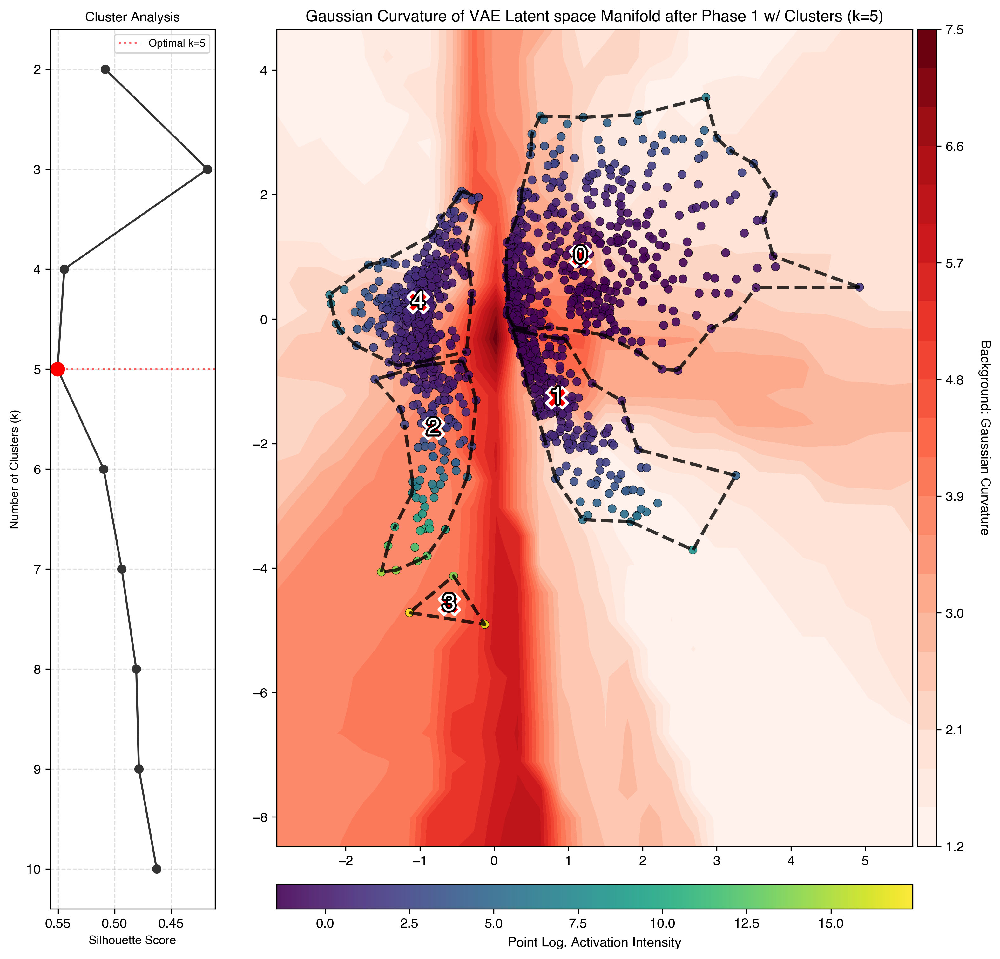

In [99]:
curvature_np = model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, plot=False, return_data=True)
plot_merged_manifold_clusters(curvature_np, Z1_np, Z2_np, latent_points, res3, dists_phase1, name='Gaussian Curvature', only_merged=True)

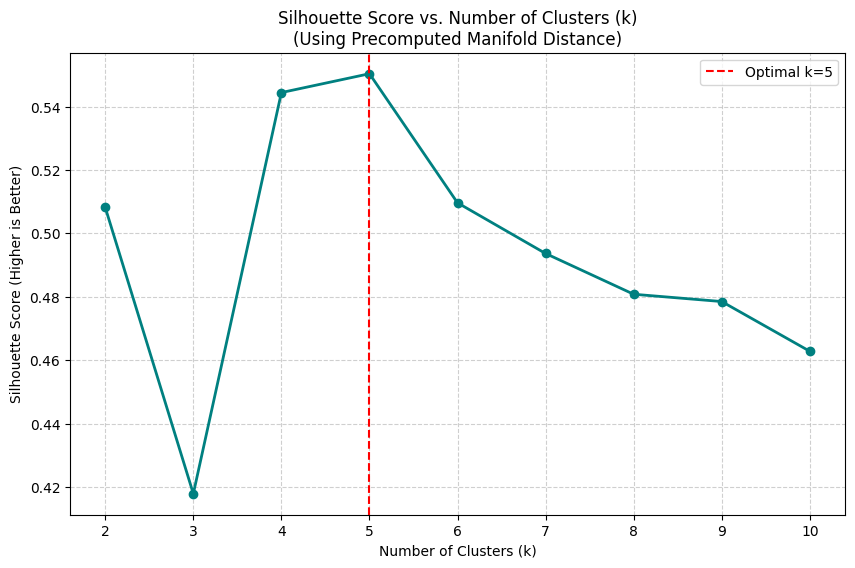

The optimal number of clusters is k=5 with a Silhouette Score of 0.5504


In [102]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Range of clusters to test
k_range = range(2, 11)  # Test k=2 to k=10
silhouette_scores = []

# --- LOOP TO FIND OPTIMAL K ---
for k in k_range:
    # 1. Fit Clustering
    model = AgglomerativeClustering(
        n_clusters=k, 
        metric='precomputed', 
        linkage='average'  # 'average' is robust for manifold distances
    )
    labels = model.fit_predict(dist_matrix_clean)
    
    # 2. Calculate Silhouette Score
    # CRITICAL: Pass metric='precomputed' so it uses your custom distance matrix
    score = silhouette_score(dist_matrix_clean, labels, metric='precomputed')
    silhouette_scores.append(score)

# --- PLOT RESULTS ---
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, marker='o', linestyle='-', color='teal', linewidth=2)

# Highlight the best k
best_k = k_range[np.argmax(silhouette_scores)]
best_score = max(silhouette_scores)
plt.axvline(x=best_k, color='red', linestyle='--', label=f'Optimal k={best_k}')

plt.title('Silhouette Score vs. Number of Clusters (k)\n(Using Precomputed Manifold Distance)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score (Higher is Better)')
plt.xticks(k_range)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.show()

print(f"The optimal number of clusters is k={best_k} with a Silhouette Score of {best_score:.4f}")

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_95593/1227230935.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_plot, x='Cluster', y='Activation', palette='viridis', inner="box", linewidth=1.5)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


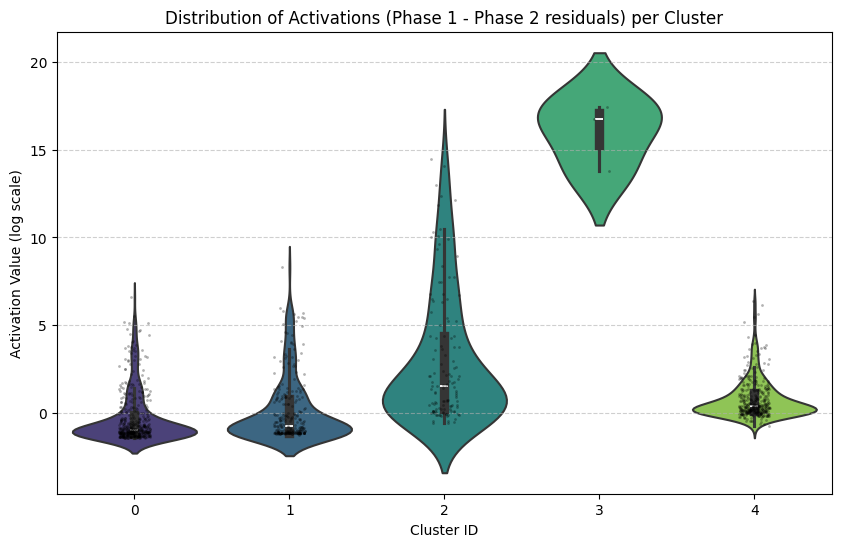

In [103]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

model = AgglomerativeClustering(
        n_clusters=best_k, 
        metric='precomputed', 
        linkage='average'  # 'average' is robust for manifold distances
    )
    
labels = model.fit_predict(dist_matrix_clean)

# 1. Prepare Data for Plotting
# We create a simple DataFrame combining the Cluster Labels and Activation Values
df_plot = pd.DataFrame({
    'Cluster': labels,  # From your AgglomerativeClustering
    'Activation': activations_clean
})

# 2. Setup the Plot
plt.figure(figsize=(10, 6))

# 3. Create a Violin Plot
# This shows both the summary statistics (box inside) and the density (shape)
sns.violinplot(data=df_plot, x='Cluster', y='Activation', palette='viridis', inner="box", linewidth=1.5)

# Optional: Add a strip plot on top to see individual data points
# (Good if you don't have millions of points, creates a "jitter" effect)
sns.stripplot(data=df_plot, x='Cluster', y='Activation', color='black', alpha=0.3, size=2)

plt.title('Distribution of Activations (Phase 1 - Phase 2 residuals) per Cluster')
plt.xlabel('Cluster ID')
plt.ylabel('Activation Value (log scale)')
plt.grid(True, axis='y', linestyle='--', alpha=0.6)

plt.savefig('cluster_activation_distributions.png')
plt.show()

Rules to define each cluster:
|--- ettot21 <= -0.20
|   |--- etbe21 <= -2.79
|   |   |--- class: 0
|   |--- etbe21 >  -2.79
|   |   |--- etaz21 <= -2.61
|   |   |   |--- p20_pop <= 0.15
|   |   |   |   |--- class: 0
|   |   |   |--- p20_pop >  0.15
|   |   |   |   |--- class: 1
|   |   |--- etaz21 >  -2.61
|   |   |   |--- ettefp1021 <= -2.92
|   |   |   |   |--- class: 0
|   |   |   |--- ettefp1021 >  -2.92
|   |   |   |   |--- class: 4
|--- ettot21 >  -0.20
|   |--- etaz21 <= -2.61
|   |   |--- p14_pop <= 0.01
|   |   |   |--- decesd22 <= 0.06
|   |   |   |   |--- class: 0
|   |   |   |--- decesd22 >  0.06
|   |   |   |   |--- class: 1
|   |   |--- p14_pop >  0.01
|   |   |   |--- etbe21 <= -2.79
|   |   |   |   |--- class: 0
|   |   |   |--- etbe21 >  -2.79
|   |   |   |   |--- class: 1
|   |--- etaz21 >  -2.61
|   |   |--- p20_log <= 0.82
|   |   |   |--- etbe21 <= -2.79
|   |   |   |   |--- class: 0
|   |   |   |--- etbe21 >  -2.79
|   |   |   |   |--- class: 4
|   |   |--- p20_lo

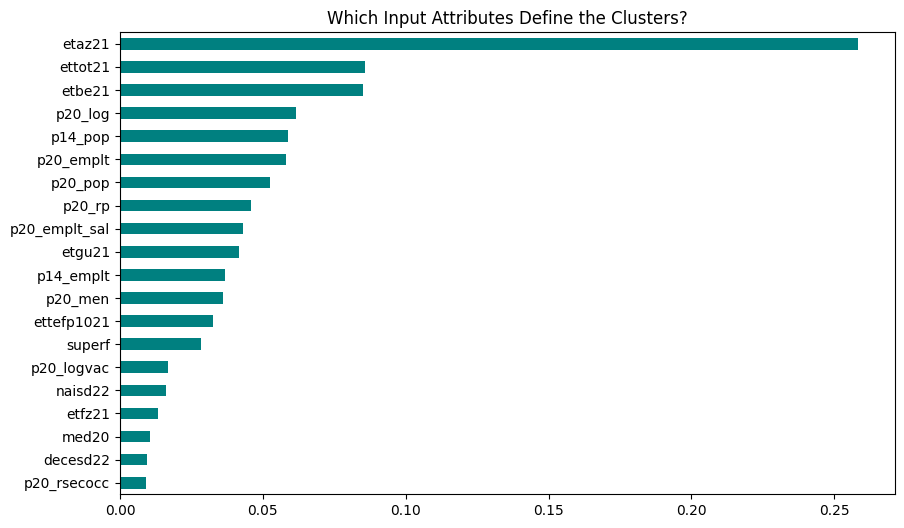

In [104]:
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import matplotlib.pyplot as plt

# 1. Prepare Data
# X_clean: Your original input attributes corresponding to the cleaned latent points
# labels: The cluster IDs from the previous step
# feature_names: A list of your attribute names (e.g., ['Temp', 'Pressure', 'Velocity'])

# 2. Train a "Proxy" Decision Tree
# We limit depth to 3 or 4 to keep the rules human-readable
tree_model = DecisionTreeClassifier(max_depth=4, random_state=42)
tree_model.fit(single_graph.x[mask].numpy(), labels)

# 3. Print the Rules
print("Rules to define each cluster:")
r = export_text(tree_model, feature_names=cols_names)
print(r)

# 4. (Optional) Check Feature Importance with a stronger model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(single_graph.x[mask].numpy(), labels)

# Plot Feature Importance
importances = pd.Series(rf.feature_importances_, index=cols_names)
importances.sort_values().plot(kind='barh', color='teal', figsize=(10, 6))
plt.title("Which Input Attributes Define the Clusters?")
plt.show()

In [105]:
import numpy as np
import pandas as pd

# 1. Ensure 'names' aligns with your cleaned data
# We apply the same mask we used for latent_points and the distance matrix
names_array = np.array(names)  # Ensure it's a numpy array for easy indexing
names_clean = names_array[mask]

# Dictionary to store results
cluster_representatives = {}

print("--- Most Representative Points (Medoids) per Cluster ---")

for i in range(n_clusters):
    # 1. Find indices of all points belonging to this cluster
    # (These indices correspond to positions in the _clean arrays)
    cluster_indices = np.where(labels == i)[0]
    
    # 2. Extract the distance sub-matrix for this cluster
    # We want to measure how close each point is to its peers
    sub_matrix = dist_matrix_clean[np.ix_(cluster_indices, cluster_indices)]
    
    # 3. Calculate "Centrality"
    # Sum the distances from each point to every other point in the cluster.
    # The point with the LOWEST sum is the most central (the Medoid).
    total_distance_per_point = sub_matrix.sum(axis=1)
    
    # 4. Get the top 3 indices with the lowest total distance
    # argsort gives us the indices relative to the 'sub_matrix'
    best_local_indices = np.argsort(total_distance_per_point)[:5]
    
    # 5. Map back to the global cleaned indices to get the names
    best_global_indices = cluster_indices[best_local_indices]
    
    representative_names = names_clean[best_global_indices]
    cluster_representatives[i] = representative_names
    
    print(f"\nCluster {i} Representatives:")
    for name in representative_names:
        print(f"  - {name}")

# Optional: Save to a DataFrame for easy viewing
df_reps = pd.DataFrame.from_dict(cluster_representatives, orient='index', 
                                 columns=['Rep 1', 'Rep 2', 'Rep 3', 'Rep 4', 'Rep 5'])

--- Most Representative Points (Medoids) per Cluster ---

Cluster 0 Representatives:
  - Everly
  - Marchémoret
  - Coulommes
  - Boutervilliers
  - Fouju

Cluster 1 Representatives:
  - Lisses
  - Montlhéry
  - Le Pecq
  - Fleury-Mérogis
  - Aubergenville

Cluster 2 Representatives:
  - Le Plessis-Robinson
  - Houilles
  - Chatou
  - Brétigny-sur-Orge
  - Limeil-Brévannes

Cluster 3 Representatives:
  - Paris 20e Arrondissement
  - Paris 18e Arrondissement
  - Paris 8e Arrondissement

Cluster 4 Representatives:
  - Monthyon
  - Thoiry
  - Bennecourt
  - Maincy
  - Janville-sur-Juine


--- Distribution Analysis (Outliers Removed: 1st-99th Percentile) ---

Cluster 0 Analysis: Size: 479 | In Med: -0.12 vs Out Med: -0.47
Cluster 0 MWU Statistic: 23611233759.0, p-value: 0.0
Cluster 0 Effect Size (Rank-Biserial): -0.0956, CLES: 0.4522
Welch's t: 45.19, Cohen's d: 0.1623

Cluster 1 Analysis: Size: 267 | In Med: 0.47 vs Out Med: -0.21
Cluster 1 MWU Statistic: 5712139584.5, p-value: 0.0
Cluster 1 Effect Size (Rank-Biserial): -0.2073, CLES: 0.3963
Welch's t: 63.54, Cohen's d: 0.4052

Cluster 2 Analysis: Size: 126 | In Med: 3.66 vs Out Med: 0.96
Cluster 2 MWU Statistic: 896753544.0, p-value: 0.0
Cluster 2 Effect Size (Rank-Biserial): -0.5869, CLES: 0.2065
Welch's t: 91.56, Cohen's d: 1.1295

Cluster 3 Analysis: Size: 3 | In Med: 11.53 vs Out Med: 9.21
Cluster 3 MWU Statistic: 11309.0, p-value: 0.0029559571725604364
Cluster 3 Effect Size (Rank-Biserial): -0.9914, CLES: 0.0043
Welch's t: 7.19, Cohen's d: 2.7401

Cluster 4 Analysis: Size: 390 | In Med: 0.99 vs Out Med: -0.10
Clus

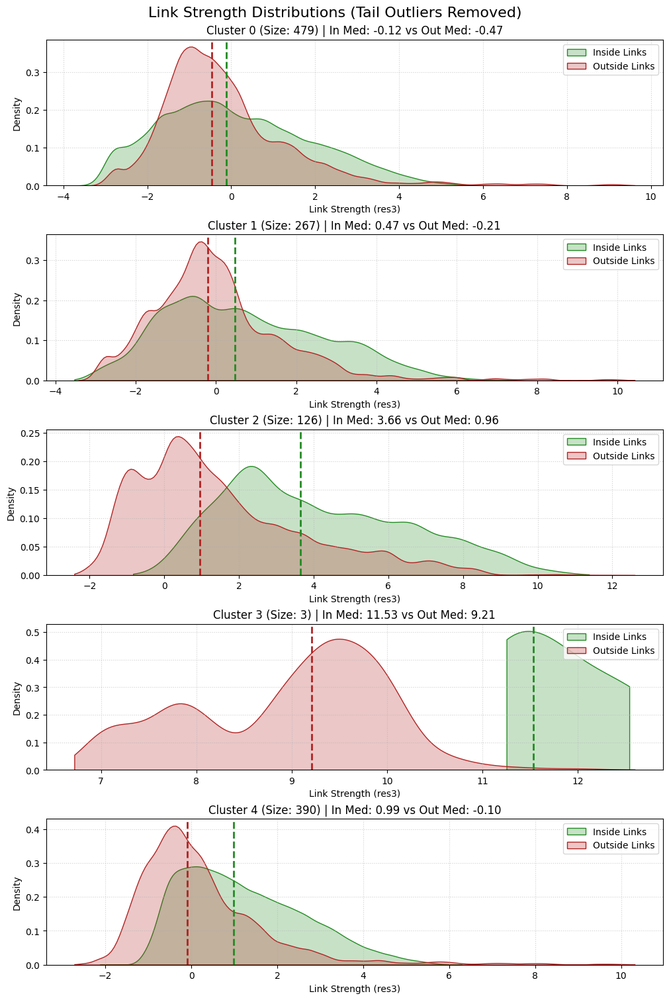

In [106]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from scipy.stats import median_abs_deviation
from scipy.stats import mannwhitneyu
import scipy.stats as stats

# --- 1. SETUP ---
warnings.filterwarnings("ignore")
res3_clean = np.log(res3[np.ix_(mask, mask)] + 1e-6)
median = np.median(res3_clean, axis=None)
mad = median_abs_deviation(res3_clean, axis=None)

res3_clean = (res3_clean - median) / mad #np.sqrt(np.var(res3_clean))
#res3_clean = (res3_clean - np.mean(res3_clean)) / np.sqrt(np.var(res3_clean))
names_clean = np.array(names)[mask]

# Helper function to remove extreme tails (1st and 99th percentile)
def remove_outliers(data, low_p=0.00, high_p=100):
    if len(data) == 0: return data
    lower_bound = np.percentile(data, low_p)
    upper_bound = np.percentile(data, high_p)
    return data[(data >= lower_bound) & (data <= upper_bound)]

# --- 2. GENERATE PLOTS ---
n_rows = n_clusters
fig, axes = plt.subplots(n_rows, 1, figsize=(10, 3 * n_rows), constrained_layout=True)
if n_clusters == 1: axes = [axes]

print("--- Distribution Analysis (Outliers Removed: 1st-99th Percentile) ---")

for k in range(n_clusters):
    ax = axes[k]
    
    # A. Extract Internal Links
    in_idx = np.where(labels == k)[0]
    block_in = res3_clean[np.ix_(in_idx, in_idx)]
    internal_links = block_in[np.triu_indices_from(block_in, k=1)]
    
    # B. Extract External Links
    out_idx = np.where(labels != k)[0]
    external_links = res3_clean[np.ix_(in_idx, out_idx)].flatten()
    
    # C. Remove Outliers for Visualization
    internal_plot = remove_outliers(internal_links)
    external_plot = remove_outliers(external_links)

    # --- D. Plotting ---
    sns.kdeplot(internal_plot, ax=ax, fill=True, color='forestgreen', label='Inside Links', cut=0)
    sns.kdeplot(external_plot, ax=ax, fill=True, color='firebrick', label='Outside Links', cut=0)

    # Calculate medians on the VISUALIZED data
    # This ensures lines fall within the humps shown
    med_in_plot = np.median(internal_plot) if len(internal_plot) > 0 else 0
    med_out_plot = np.median(external_plot) if len(external_plot) > 0 else 0

    ax.axvline(med_in_plot, color='forestgreen', linestyle='--', linewidth=2)
    ax.axvline(med_out_plot, color='firebrick', linestyle='--', linewidth=2)
    
    ax.set_title(f"Cluster {k} (Size: {len(in_idx)}) | In Med: {med_in_plot:.2f} vs Out Med: {med_out_plot:.2f}")
    ax.set_xlabel('Link Strength (res3)')
    ax.legend(loc='upper right')
    ax.grid(True, linestyle=':', alpha=0.6)
    print(f"\nCluster {k} Analysis: Size: {len(in_idx)} | In Med: {med_in_plot:.2f} vs Out Med: {med_out_plot:.2f}")
    u_stat, p_value = mannwhitneyu(internal_links, external_links, alternative='two-sided')
    print(f"Cluster {k} MWU Statistic: {u_stat}, p-value: {p_value}")
    n1, n2 = len(internal_links), len(external_links)
    effect_size = 1 - (2 * u_stat) / (n1 * n2)
    cles = (effect_size + 1) / 2
    print(f"Cluster {k} Effect Size (Rank-Biserial): {effect_size:.4f}, CLES: {cles:.4f}")  
    # res = stats.bootstrap((internal_links, external_links), 
    #                     np.mean, 
    #                     paired=False, 
    #                     vectorized=False, 
    #                     method='percentile')

    # # If the confidence interval for the difference doesn't cross 0, it's significant
    # ci_low, ci_high = res.confidence_interval  
    # print(f"Cluster {k} Bootstrap CI: [{ci_low:.4f}, {ci_high:.4f}]")  

    def welch_stats(in_links, out_links):
        m1, m2 = np.mean(in_links), np.mean(out_links)
        v1, v2 = np.var(in_links, ddof=1), np.var(out_links, ddof=1)
        n1, n2 = len(in_links), len(out_links)
        
        # Welch's t-statistic
        t_stat = (m1 - m2) / np.sqrt(v1/n1 + v2/n2)
        
        # Cohen's d (Effect Size)
        pooled_sd = np.sqrt(((n1-1)*v1 + (n2-1)*v2) / (n1+n2-2))
        d = (m1 - m2) / pooled_sd
        
        return t_stat, d

    # Apply to Cluster 0
    t, d = welch_stats(internal_links, external_links)
    print(f"Welch's t: {t:.2f}, Cohen's d: {d:.4f}")


plt.suptitle('Link Strength Distributions (Tail Outliers Removed)', fontsize=16)
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


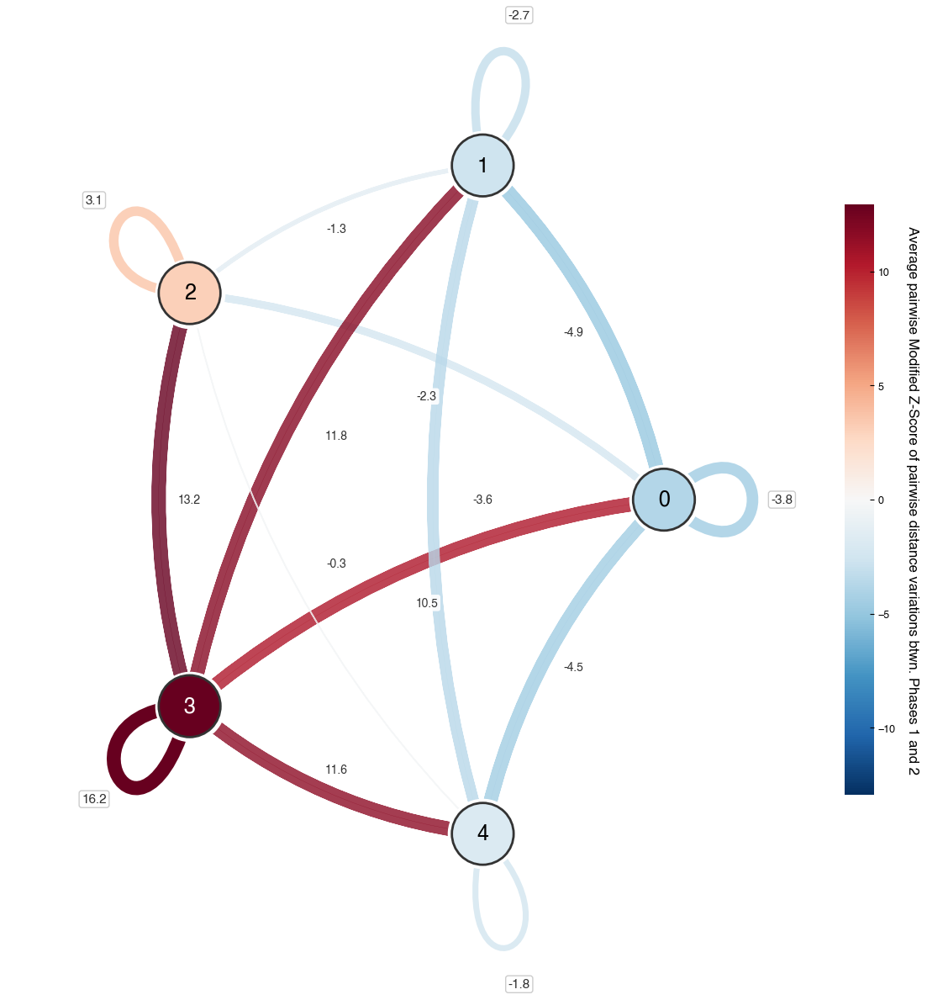

In [107]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.path import Path # <--- NEW IMPORT NEEDED

# --- 1. CALCULATE MATRIX ---
n_clusters = best_k
interaction_matrix = np.zeros((n_clusters, n_clusters))

for i in range(n_clusters):
    for j in range(n_clusters):
        rows = np.where(labels == i)[0]
        cols = np.where(labels == j)[0]
        block = res3_clean[np.ix_(rows, cols)]
        if i == j:
            links = block[np.triu_indices_from(block, k=1)]
            mean_val = np.mean(links) if len(links) > 0 else 0
        else:
            mean_val = np.mean(block)
        interaction_matrix[i, j] = (mean_val - median) / mad

# --- 2. SETUP GRAPH ---
G = nx.Graph() 

# FIX 1: Dynamic Color Scaling
# Instead of hardcoding -2/2, we check the actual max value in your data
max_val = np.max(np.abs(interaction_matrix))
# Cap visual range at 80% of max to keep contrast, or use max_val directly
limit = max(2.0, max_val * 0.8) 

cmap = plt.cm.RdBu_r 
norm = plt.Normalize(vmin=-limit, vmax=limit)

edge_list = []
self_loops = []

for i in range(n_clusters):
    G.add_node(i, weight=interaction_matrix[i, i])
    for j in range(i, n_clusters):
        score = interaction_matrix[i, j]
        color = cmap(norm(score))
        
        # FIX 2: Width Clamping
        # We calculate raw width, but cap it at 12 to prevent "filling" the loops
        raw_width = 0.5 + 2.5 * (abs(score)**1.0) # Reduced power slightly
        width = min(raw_width, 12) 
        
        if i == j:
            self_loops.append({'node': i, 'score': score, 'color': color, 'width': width})
        else:
            G.add_edge(i, j, color=color, width=width, weight=score)
            edge_list.append((i, j))

# --- 3. PLOTTING ---
plt.figure(figsize=(12, 12), facecolor='white')
ax = plt.gca()
pos = nx.circular_layout(G, scale=1.0)

# A. Regular Edges
for u, v in edge_list:
    attr = G[u][v]
    edge_patch = patches.FancyArrowPatch(
        pos[u], pos[v], 
        connectionstyle="arc3,rad=0.15", # Reduced curvature slightly for cleaner center
        color=attr['color'], 
        linewidth=attr['width'],
        alpha=0.8,
        zorder=1
    )
    ax.add_patch(edge_patch)
    
    # FIX 3: Label Readability
    # Only label significant edges to reduce clutter
    if abs(attr['weight']) > 0.0:
        x_text = (pos[u][0] + pos[v][0]) / 2 * 1
        y_text = (pos[u][1] + pos[v][1]) / 2 * 1
        
        # White Halo around text using bbox
        ax.text(x_text, y_text, f"{attr['weight']:.1f}", 
                fontsize=10, color='#333333', fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.9, linewidth=0),
                horizontalalignment='center', verticalalignment='center', zorder=2)

# B. Nodes
node_colors = [cmap(norm(G.nodes[n]['weight'])) for n in G.nodes]
labels_normal = {node: node for node in G.nodes() if node != 3}
# Group B: Only node 3
labels_special = {3: 3}

nx.draw_networkx_nodes(G, pos, node_size=3500, node_color='white', alpha=1.0, ax=ax)
nx.draw_networkx_nodes(G, pos, node_size=2800, node_color=node_colors, 
                       edgecolors='#333333', linewidths=2, ax=ax)

nx.draw_networkx_labels(G, pos, labels=labels_normal, font_size=18, font_family='sans-serif', font_weight='bold', font_color='black')
nx.draw_networkx_labels(G, pos, labels=labels_special, font_size=18, font_family='sans-serif', font_weight='bold',font_color='white')

# C. Self Loops (Bezier)
for loop in self_loops:
    node_idx = loop['node']
    x, y = pos[node_idx]
    angle = np.arctan2(y, x)
    
    # Parameters
    loop_spread = np.radians(35) 
    arm_length = 0.55
    
    theta_1 = angle - loop_spread
    theta_2 = angle + loop_spread
    
    cp1 = (x + arm_length * np.cos(theta_1), y + arm_length * np.sin(theta_1))
    cp2 = (x + arm_length * np.cos(theta_2), y + arm_length * np.sin(theta_2))
    
    verts = [(x, y), cp1, cp2, (x, y)]
    codes = [Path.MOVETO, Path.CURVE4, Path.CURVE4, Path.CURVE4]
    path = Path(verts, codes)
    
    loop_patch = patches.FancyArrowPatch(
        path=path,
        color=loop['color'],
        linewidth=loop['width'],
        arrowstyle='-', 
        alpha=1.0,
        zorder=0,
        capstyle='round' # Rounds the ends of the lines for smoother look
    )
    ax.add_patch(loop_patch)
    
    # Label
    label_dist = 0.45
    lx = x + np.cos(angle) * label_dist
    ly = y + np.sin(angle) * label_dist
    
    ax.text(lx, ly, f"{loop['score']:.1f}", fontsize=11, fontweight='bold', color='#333333',
            horizontalalignment='center', verticalalignment='center',
            bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=1.0, edgecolor='#cccccc'))

# --- 4. FINISH ---
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Helvetica', 'Arial', 'DejaVu Sans'],
    'pdf.fonttype': 42,
    'ps.fonttype': 42,

    'font.size': 10,
    'axes.labelsize': 10,
    'axes.titlesize': 11,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 12,

    # --- BOXED STYLE SETTINGS ---
    'axes.linewidth': 1.0,       
    'grid.linewidth': 0.5,
    'lines.linewidth': 1.5,
    
    # 1. Point ticks inward
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    
    # 2. Enable ticks on Top and Right (Mirroring)
    'xtick.top': True,
    'ytick.right': True,
    
    # 3. Force all Spines (Borders) to be visible
    'axes.spines.top': True,
    'axes.spines.right': True,
    'axes.spines.left': True,
    'axes.spines.bottom': True,

    'axes.prop_cycle': plt.cycler('color', sns.color_palette("deep")) 
})

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.6, pad=0.05)
cbar.set_label('Average pairwise Modified Z-Score of pairwise distance variations btwn. Phases 1 and 2', rotation=270, labelpad=20, fontsize=12)
cbar.outline.set_visible(False)

#plt.title("Cluster Interaction Network", fontsize=20, fontweight='bold', pad=20)
plt.axis('off')
plt.xlim(-1.5, 1.5)
plt.ylim(-1.4, 1.4)
plt.tight_layout()
plt.savefig("cluster_net.eps", dpi=300, bbox_inches='tight')
plt.show()

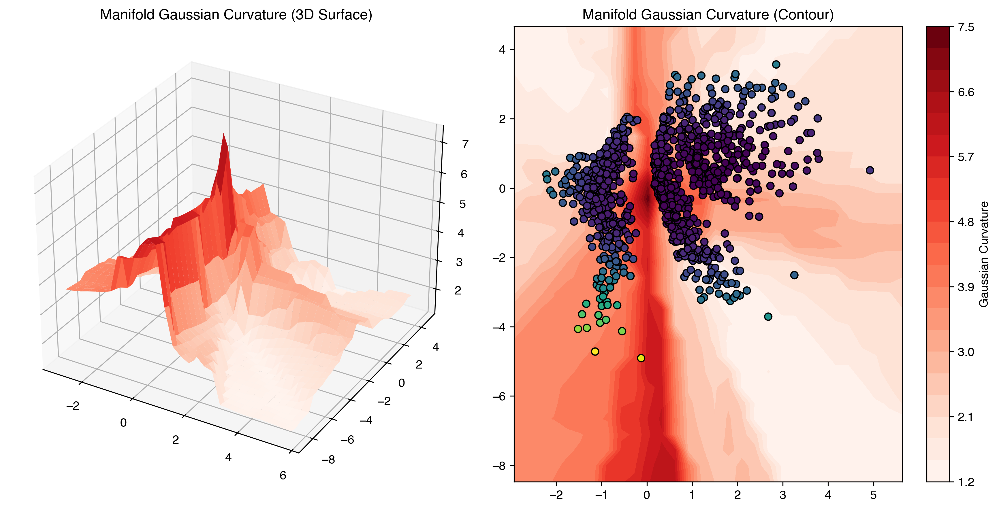

In [20]:
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points_clean, labels=torch.tensor(activations_clean))


Full grid already computed for current epoch.
Full grid already computed for current epoch.


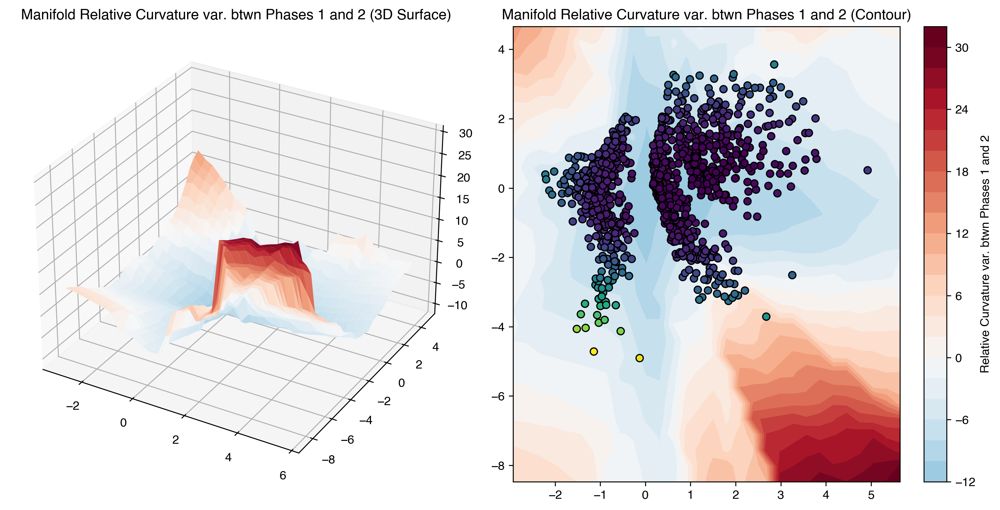

In [57]:
from framework.utils import compute_curvature_change
curvature_diff, Z1_np, Z2_np = compute_curvature_change(model_phase1, model_phase2)
model_phase2.get_latent_manifold()._plot_manifold_grid(curvature_diff, Z1_np, Z2_np, latent_points=latent_points_clean, labels=torch.tensor(activations_clean), name="Relative Curvature var. btwn Phases 1 and 2")

### Analysis

In [21]:
y = res3_z
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle without diagonal
res3_z_pairs = res3_z[pairs]
res3_pairs = res3[pairs]

##### Simple regression on nodes

In [22]:
import statsmodels.api as sm

x = single_graph.x[:, [0,2, 4, 5, 9, 10, 11, 15, 16, 17, 18, 19]].numpy()
x = sm.add_constant(x)
y = res3_z.sum(axis=1).flatten()

model = sm.OLS(y,x)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.089
Model:                            OLS   Adj. R-squared:                  0.080
Method:                 Least Squares   F-statistic:                     10.18
Date:                Sat, 17 Jan 2026   Prob (F-statistic):           2.39e-19
Time:                        14:42:30   Log-Likelihood:                -10304.
No. Observations:                1266   AIC:                         2.063e+04
Df Residuals:                    1253   BIC:                         2.070e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -111.8294     33.386     -3.350      0.0

##### Simple regression on links

In [23]:
X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant from original x
    # build symmetric regressors
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = sm.add_constant(np.array(X_pairs))
print(sm.OLS(res3_pairs, X_pairs).fit().summary())
print(sm.OLS(res3_z_pairs, X_pairs).fit().summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.311
Model:                            OLS   Adj. R-squared:                  0.311
Method:                 Least Squares   F-statistic:                 1.507e+04
Date:                Sat, 17 Jan 2026   Prob (F-statistic):               0.00
Time:                        14:42:32   Log-Likelihood:            -8.7376e+06
No. Observations:              800745   AIC:                         1.748e+07
Df Residuals:                  800720   BIC:                         1.748e+07
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1469.4000     42.563    -34.523      0.0

##### Regression on links but with PCA

In [24]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

x_communes_raw = single_graph.x.numpy()
scaler = StandardScaler()
x_communes_scaled = scaler.fit_transform(x_communes_raw)

# Extract dimensions
pca = PCA(n_components=0.90) # Keep 90% variance
x_manifold = pca.fit_transform(x_communes_scaled)

n_components = x_manifold.shape[1]
pc_names = [f"PC{i+1}" for i in range(n_components)]

# Interpretation Table
# Create a DataFrame of loadings (Weights)
loadings = pd.DataFrame(
    pca.components_.T, 
    index=cols_names, 
    columns=pc_names
)

print("--- Deep Interpretation (Top 3 Drivers per PC) ---")

for col in loadings.columns:
    # Sort by absolute value to find the strongest drivers
    top_3 = loadings[col].abs().sort_values(ascending=False).head(3)
    
    # Get the actual values (to see +/- signs)
    top_3_values = loadings.loc[top_3.index, col]
    
    # Format for reading
    drivers = [f"{name} ({val:+.2f})" for name, val in top_3_values.items()]
    print(f"{col}: {', '.join(drivers)}")

# --- 4. REBUILD PAIRS ON MANIFOLD ---
y = res3
n = y.shape[0]
pairs = np.triu_indices(n, k=1)
y_pairs = y[pairs]

X_manifold_pairs = []

# Loop to create Sum/Diff of the Principal Components
for i, j in zip(*pairs):
    pc_i = x_manifold[i]
    pc_j = x_manifold[j]
    
    # We use Sum and AbsDiff of the Latent Dimensions
    feats = np.concatenate([pc_i + pc_j, np.abs(pc_i - pc_j)])
    X_manifold_pairs.append(feats)

X_manifold_pairs = np.array(X_manifold_pairs)

# Name the new regressors
pc_sum_names = [f"{pc}_sum" for pc in pc_names]
pc_diff_names = [f"{pc}_absdiff" for pc in pc_names]
final_names = ["const"] + pc_sum_names + pc_diff_names

# Add constant for the regression
X_manifold_pairs = sm.add_constant(X_manifold_pairs)

# --- 5. FINAL ROBUST REGRESSION ---
print("\n=== Robust Regression on Latent Structure ===")
model_rlm = sm.RLM(res3_pairs, X_manifold_pairs, M=sm.robust.norms.HuberT())
results_rlm = model_rlm.fit()

print(results_rlm.summary(xname=final_names))

--- Deep Interpretation (Top 3 Drivers per PC) ---
PC1: p20_log (+0.26), p20_men (+0.26), p20_rp (+0.26)
PC2: superf (+0.72), etaz21 (+0.66), med20 (-0.16)
PC3: med20 (+0.90), etaz21 (+0.34), ettefp1021 (+0.13)
PC4: p20_rsecocc (+0.59), etbe21 (-0.35), ettefp1021 (-0.32)
PC5: etaz21 (+0.58), superf (-0.56), etbe21 (-0.36)
PC6: etfz21 (+0.79), decesd22 (+0.32), etbe21 (-0.30)

=== Robust Regression on Latent Structure ===
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:               800745
Model:                            RLM   Df Residuals:                   800732
Method:                          IRLS   Df Model:                           12
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                S

In [25]:
# Calculate predictions and residuals
def compute_R_squared_from_RLM(results_rlm, y_pairs):
    y_pred = results_rlm.fittedvalues
    residuals = y_pairs - y_pred  # Use raw residuals, not weighted ones

    # 1. Calculate Standard R-squared
    # R2 = 1 - (Sum of Squared Residuals / Total Sum of Squares)
    sst_val = np.sum((y_pairs - np.mean(y_pairs))**2)
    ssr_val = np.sum(residuals**2)
    r_squared = 1 - (ssr_val / sst_val)

    # 2. Calculate Adjusted R-squared
    # Adj_R2 = 1 - (1 - R2) * ((n - 1) / (n - p - 1))
    n = len(y_pairs)              # Number of observations (800,745)
    p = results_rlm.df_model      # Number of predictors (12)

    adj_r_squared = 1 - (1 - r_squared) * ((n - 1) / (n - p - 1))

    print(f"Pseudo R-squared:          {r_squared:.4f}")
    print(f"Pseudo Adjusted R-squared: {adj_r_squared:.4f}")

compute_R_squared_from_RLM(results_rlm, res3_pairs)

Pseudo R-squared:          -0.0015
Pseudo Adjusted R-squared: -0.0015


In [26]:
# --- 1. SETUP TWO-WAY CLUSTERS ---
# We need a matrix with 2 columns: [Origin_ID, Dest_ID]
# statsmodels will automatically calculate: Var(Origin) + Var(Dest) - Var(Intersection)
i_idx, j_idx = pairs

# Create a dataframe of the two grouping variables
# Ensure these are integer IDs or categorical codes
two_way_groups = pd.DataFrame({
    'Origin_Cluster': i_idx,
    'Dest_Cluster': j_idx
})

print(f"Clustering on {two_way_groups.shape[1]} dimensions: Origin and Destination.")

# --- 2. RUN OLS WITH 2-WAY CLUSTERING ---
model_ols = sm.OLS(res3_pairs, X_manifold_pairs)

# Pass the 2-column dataframe to 'groups'
results_2way = model_ols.fit(cov_type='cluster', cov_kwds={'groups': two_way_groups})

# --- 3. COMPARE RESULTS ---
print(results_2way.summary(xname=final_names))

# Optional: Inspect the calculated standard errors directly
print("\nComputed Clustered Standard Errors (Diagonal of Covariance Matrix):")
print(results_2way.bse)

Clustering on 2 dimensions: Origin and Destination.
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.088
Model:                            OLS   Adj. R-squared:                  0.088
Method:                 Least Squares   F-statistic:                    0.1331
Date:                Sat, 17 Jan 2026   Prob (F-statistic):               1.00
Time:                        14:42:50   Log-Likelihood:            -8.8501e+06
No. Observations:              800745   AIC:                         1.770e+07
Df Residuals:                  800732   BIC:                         1.770e+07
Df Model:                          12                                         
Covariance Type:              cluster                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

In [27]:
print("--- REVERTING TO 1-WAY CLUSTERING (ORIGIN) ---")
print("Justification: 2-Way clustering on unbalanced networks (Hub & Spoke)")
print("yields inflated standard errors due to the dominant size of the Hub cluster.")

model_ols = sm.OLS(res3_pairs, X_manifold_pairs)
# Re-run the version that worked (Origin Clustering only)
results_final = model_ols.fit(cov_type='cluster', cov_kwds={'groups': i_idx})

print(results_final.summary(xname=final_names))

--- REVERTING TO 1-WAY CLUSTERING (ORIGIN) ---
Justification: 2-Way clustering on unbalanced networks (Hub & Spoke)
yields inflated standard errors due to the dominant size of the Hub cluster.
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.088
Model:                            OLS   Adj. R-squared:                  0.088
Method:                 Least Squares   F-statistic:                     36.87
Date:                Sat, 17 Jan 2026   Prob (F-statistic):           4.40e-74
Time:                        14:42:51   Log-Likelihood:            -8.8501e+06
No. Observations:              800745   AIC:                         1.770e+07
Df Residuals:                  800732   BIC:                         1.770e+07
Df Model:                          12                                         
Covariance Type:              cluster                                         
                 

In [28]:
# --- 1. SETUP DATA ---
# We assume 'results_final' is your latest OLS model
# We need the City Names to make sense of the indices
# Replace 'names' with your actual list/column of commune names (e.g. df['LIBGEO'])
if 'names' not in locals():
    # Placeholder if you forgot to load names
    print("⚠️ 'names' variable not found. Using numeric IDs.")
    names = [f"City_{i}" for i in range(x.shape[0])]
else:
    names = list(names) # Ensure it's indexable

# --- 2. CALCULATE RESIDUALS ---
# Residual = Actual y - Predicted y
# y = Friction/Gap
residuals = results_final.resid
predicted = results_final.fittedvalues

# Create a DataFrame for easy sorting
# i_idx, j_idx are your origin/dest indices from the 'pairs' variable
outlier_df = pd.DataFrame({
    'Origin_ID': i_idx,
    'Dest_ID': j_idx,
    'Origin': [names[i] for i in i_idx],
    'Dest': [names[i] for i in j_idx],
    'Actual_Friction': y_pairs,
    'Predicted_Friction': predicted,
    'Residual': residuals
})

# --- 3. THE "HELL" LINKS (Highest Positive Residuals) ---
# These are links that are MUCH worse than their attributes suggest.
# e.g. Two dense, poor suburbs that SHOULD be connected but are not.
print("\n=== TOP 10 'UNDER-PERFORMING' LINKS (Unexpectedly High Friction) ===")
print("Model expects good connection, Reality is bad.")
top_bad = outlier_df.sort_values(by='Residual', ascending=False).head(20)
print(top_bad[['Origin', 'Dest', 'Residual', 'Actual_Friction', 'Predicted_Friction']])

# --- 4. THE "MAGIC" LINKS (Lowest Negative Residuals) ---
# These are links that are MUCH better than their attributes suggest.
# e.g. A distant suburb connected by a direct express train.
print("\n=== TOP 10 'OVER-PERFORMING' LINKS (Unexpectedly Low Friction) ===")
print("Model expects bad connection, Reality is good.")
top_good = outlier_df.sort_values(by='Residual', ascending=True).head(20)
print(top_good[['Origin', 'Dest', 'Residual', 'Actual_Friction', 'Predicted_Friction']])


=== TOP 10 'UNDER-PERFORMING' LINKS (Unexpectedly High Friction) ===
Model expects good connection, Reality is bad.
                          Origin                      Dest      Residual  \
462427  Paris 18e Arrondissement  Paris 15e Arrondissement  1.108336e+06   
711849   Paris 8e Arrondissement  Paris 15e Arrondissement  1.105515e+06   
796024  Paris 20e Arrondissement  Paris 15e Arrondissement  9.263234e+05   
779770  Paris 16e Arrondissement  Paris 15e Arrondissement  8.749123e+05   
451650  Paris 17e Arrondissement  Paris 15e Arrondissement  8.723853e+05   
255190  Paris 13e Arrondissement  Paris 15e Arrondissement  8.433235e+05   
544710  Paris 19e Arrondissement  Paris 15e Arrondissement  8.245495e+05   
757020  Paris 11e Arrondissement  Paris 15e Arrondissement  7.882410e+05   
614325  Paris 12e Arrondissement  Paris 15e Arrondissement  7.785959e+05   
774574  Paris 14e Arrondissement  Paris 15e Arrondissement  7.399560e+05   
140005               Saint-Denis  Paris 15e Arr

In [29]:
# --- NODE LEVEL DIAGNOSIS ---
# We calculate the mean residual for each city acting as a Destination (Incoming)
# (You can also do Origin, but Destination usually reflects "Attractiveness" efficiency)

# Group by Destination name and take the average of the residuals
node_scores = outlier_df.groupby('Dest')['Residual'].mean().sort_values(ascending=False)

# Convert to DataFrame for display
node_analysis = pd.DataFrame({
    'Mean_Residual': node_scores,
    'Status': ['Under-Served' if x < 0 else 'Over-Served' for x in node_scores]
})

# --- 1. THE "TRANSPORT TRAPS" (Worst Unexplained Friction) ---
# These cities are harder to reach than the model predicts.
print("\n=== TOP 10 'UNDER-SERVED' CITIES (Positive Residuals) ===")
print("The model says: 'You should be connected.' Reality says: 'You are isolated.'")
print(node_analysis.tail(10))

# --- 2. THE "HYPER-CONNECTED" (Best Unexplained Friction) ---
# These cities are easier to reach than the model predicts.
print("\n=== TOP 10 'OVER-SERVED' CITIES (Negative Residuals) ===")
print("The model says: 'You are just a city.' Reality says: 'You are a Hub.'")
print(node_analysis.head(10))


=== TOP 10 'UNDER-SERVED' CITIES (Positive Residuals) ===
The model says: 'You should be connected.' Reality says: 'You are isolated.'
                          Mean_Residual        Status
Dest                                                 
Boulogne-Billancourt      -10615.362330  Under-Served
Paris 11e Arrondissement  -10828.306896  Under-Served
Paris 13e Arrondissement  -10931.741058  Under-Served
Saint-Germain-en-Laye     -11164.645969  Under-Served
Paris 7e Arrondissement   -11240.593473  Under-Served
Paris 14e Arrondissement  -11314.042076  Under-Served
Versailles                -11951.193417  Under-Served
Paris 17e Arrondissement  -12032.542383  Under-Served
Paris 18e Arrondissement  -13142.889670  Under-Served
Paris 16e Arrondissement  -13950.717561  Under-Served

=== TOP 10 'OVER-SERVED' CITIES (Negative Residuals) ===
The model says: 'You are just a city.' Reality says: 'You are a Hub.'
                          Mean_Residual       Status
Dest                               

In [30]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

# Build names dynamically
sum_cols = [f"{c}_sum" for c in cols_names[:X_pairs.shape[1] // 2]]
diff_cols = [f"{c}_absdiff" for c in cols_names[:X_pairs.shape[1] // 2]]
regressor_names = ["const"] + sum_cols + diff_cols

# Add constant AFTER naming
X_pairs = sm.add_constant(X_pairs)

# Double-check match
assert X_pairs.shape[1] == len(regressor_names), \
    f"Mismatch: {X_pairs.shape[1]} vs {len(regressor_names)}"


In [31]:

# Fit with clustering
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node

model = sm.OLS(res3_pairs, X_pairs)
results = model.fit(cov_type="cluster", cov_kwds={"groups": clusters})

print(results.summary(xname=regressor_names))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.311
Model:                            OLS   Adj. R-squared:                  0.311
Method:                 Least Squares   F-statistic:                     28.63
Date:                Sat, 17 Jan 2026   Prob (F-statistic):          1.31e-101
Time:                        14:42:53   Log-Likelihood:            -8.7376e+06
No. Observations:              800745   AIC:                         1.748e+07
Df Residuals:                  800720   BIC:                         1.748e+07
Df Model:                          24                                         
Covariance Type:              cluster                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -1469.4000    

In [32]:
import pandas as pd


model = sm.OLS(res3_pairs, X_pairs)
results = model.fit(
    cov_type="cluster",
    cov_kwds={"groups": clusters}
)

results.summary(xname=regressor_names)

from linearmodels.iv import IV2SLS

df = pd.DataFrame(X_pairs, columns=regressor_names)
df["y"] = y_pairs
df["i"] = i_idx
df["j"] = j_idx

model = IV2SLS.from_formula(
    "y ~ 1 + " + " + ".join(sum_cols + diff_cols),
    data=df
)

# two-way clustering by i and j
res = model.fit(cov_type="clustered", clusters=df[["i", "j"]])
print(res.summary)


                            OLS Estimation Summary                            
Dep. Variable:                      y   R-squared:                      0.3112
Estimator:                        OLS   Adj. R-squared:                 0.3112
No. Observations:              800745   F-statistic:                    7.0644
Date:                Sat, Jan 17 2026   P-value (F-stat)                0.9997
Time:                        14:43:01   Distribution:                 chi2(24)
Cov. Estimator:             clustered                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept              -1469.4     893.54    -1.6445     0.1001     -3220.7      281.90
p20_pop_sum     

In [33]:
import pandas as pd

def classify_pairwise_regression(results, regressor_names, alpha=0.05):
    """
    Classify pairwise regression coefficients into categories:
    - Convergence drivers
    - Divergence drivers
    - Homophily
    - Heterophily
    Only coefficients with p < alpha are considered significant.
    """

    coef = results.params
    df = pd.DataFrame({
        "regressor": regressor_names,
        "coef": coef,
        "pval": results.pvalues
    })

    # keep only significant variables
    df_sig = df[df["pval"] < alpha]

    categories = {"convergence": [], "divergence": [], "homophily": [], "heterophily": []}

    for _, row in df_sig.iterrows():
        name, c = row["regressor"], row["coef"]

        if name.endswith("_sum"):
            if c > 0:
                categories["convergence"].append((name, c))
            elif c < 0:
                categories["divergence"].append((name, c))

        elif name.endswith("_absdiff"):
            if c > 0:
                categories["heterophily"].append((name, c))
            elif c < 0:
                categories["homophily"].append((name, c))

    # Print with explanations
    print("\nInterpretation of regression results (significant at p < {}):".format(alpha))
    print("• Convergence: positive _sum → larger joint values reduce relative distance.")
    print("• Divergence: negative _sum → larger joint values increase relative distance.")
    print("• Homophily: negative _absdiff → similarity reduces distance.")
    print("• Heterophily: positive _absdiff → dissimilarity reduces distance.\n")

    for cat, vars_ in categories.items():
        if vars_:
            print(f"{cat.capitalize()} drivers:")
            for name, coef in vars_:
                print(f"  - {name}: {coef:.4f}")
            print("")

    return categories, df, df_sig

classify_pairwise_regression(results, regressor_names)


Interpretation of regression results (significant at p < 0.05):
• Convergence: positive _sum → larger joint values reduce relative distance.
• Divergence: negative _sum → larger joint values increase relative distance.
• Homophily: negative _absdiff → similarity reduces distance.
• Heterophily: positive _absdiff → dissimilarity reduces distance.

Convergence drivers:
  - p20_pop_sum: 13630.1805
  - naisd22_sum: 2174.7454
  - decesd22_sum: 373.6757
  - p20_log_sum: 9698.1836
  - p20_rp_sum: 326.8449

Divergence drivers:
  - p14_pop_sum: -352.1485
  - superf_sum: -9668.8776
  - p20_men_sum: -525.7308
  - p20_rsecocc_sum: -502.3332
  - p20_logvac_sum: -1494.0689
  - med20_sum: -10395.3206
  - p20_emplt_sum: -798.9400

Homophily drivers:
  - p14_pop_absdiff: -478.3513
  - superf_absdiff: -9868.7275
  - p20_men_absdiff: -419.4207
  - decesd22_absdiff: -427.3545
  - p20_rsecocc_absdiff: -439.2929
  - p20_logvac_absdiff: -1495.6736
  - med20_absdiff: -10836.6439
  - p20_emplt_absdiff: -767.9

({'convergence': [('p20_pop_sum', 13630.180505984123),
   ('naisd22_sum', 2174.745447591296),
   ('decesd22_sum', 373.6757453094411),
   ('p20_log_sum', 9698.183625507365),
   ('p20_rp_sum', 326.84489122059097)],
  'divergence': [('p14_pop_sum', -352.14848066041094),
   ('superf_sum', -9668.877621161924),
   ('p20_men_sum', -525.7308455027824),
   ('p20_rsecocc_sum', -502.33317304715615),
   ('p20_logvac_sum', -1494.0689130663782),
   ('med20_sum', -10395.320617311643),
   ('p20_emplt_sum', -798.9400106035278)],
  'homophily': [('p14_pop_absdiff', -478.3513337549067),
   ('superf_absdiff', -9868.727512633192),
   ('p20_men_absdiff', -419.4206705615456),
   ('decesd22_absdiff', -427.3545354165674),
   ('p20_rsecocc_absdiff', -439.2928903837168),
   ('p20_logvac_absdiff', -1495.673647432205),
   ('med20_absdiff', -10836.643862634579),
   ('p20_emplt_absdiff', -767.9837178451587)],
  'heterophily': [('p20_pop_absdiff', 13756.426241705005),
   ('naisd22_absdiff', 2617.3401594485194),
   ('

### Original distances

In [34]:
import numpy as np
import pandas as pd
import statsmodels.api as sm


y = adjacency_matrix
x = p_vectors_array[:, [0,2, 4, 5, 9, 10, 11, 15, 16, 17, 18, 19]]
x = sm.add_constant(x)
n = y.shape[0]
pairs = np.triu_indices(n, k=1)  # upper triangle
y_pairs = y[pairs]

# original feature names you actually used
cols = [
    "p20_pop", "p14_pop", "superf", "p20_men", "naisd22", "decesd22",
    "p20_log", "p20_rp", "p20_rsecocc", "p20_logvac", "med20",
    "p20_emplt", "p20_emplt_sal", "p14_emplt", "ettot21", "etaz21",
    "etbe21", "etfz21", "etgu21", "ettefp1021"
]

X_pairs = []
for i, j in zip(*pairs):
    xi, xj = x[i, 1:], x[j, 1:]  # drop constant
    feats = np.concatenate([xi + xj, np.abs(xi - xj)])
    X_pairs.append(feats)

X_pairs = np.array(X_pairs)

# Build names dynamically
sum_cols = [f"{c}_sum" for c in cols[:X_pairs.shape[1] // 2]]
diff_cols = [f"{c}_absdiff" for c in cols[:X_pairs.shape[1] // 2]]
regressor_names = ["const"] + sum_cols + diff_cols

# Add constant AFTER naming
X_pairs = sm.add_constant(X_pairs)

# Double-check match
assert X_pairs.shape[1] == len(regressor_names), \
    f"Mismatch: {X_pairs.shape[1]} vs {len(regressor_names)}"

# Fit with clustering
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(cov_type="cluster", cov_kwds={"groups": clusters})

print(results.summary(xname=regressor_names))


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     5.412
Date:                Sat, 17 Jan 2026   Prob (F-statistic):           1.39e-15
Time:                        14:43:05   Log-Likelihood:             2.8533e+06
No. Observations:              800745   AIC:                        -5.707e+06
Df Residuals:                  800720   BIC:                        -5.706e+06
Df Model:                          24                                         
Covariance Type:              cluster                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0004   5

In [35]:
import pandas as pd

# Pairs
i_idx, j_idx = pairs
clusters = pd.Series(i_idx)  # cluster by first node of the pair

model = sm.OLS(y_pairs, X_pairs)
results = model.fit(
    cov_type="cluster",
    cov_kwds={"groups": clusters}
)

results.summary(xname=regressor_names)

from linearmodels.iv import IV2SLS

df = pd.DataFrame(X_pairs, columns=regressor_names)
df["y"] = y_pairs
df["i"] = i_idx
df["j"] = j_idx

model = IV2SLS.from_formula(
    "y ~ 1 + " + " + ".join(sum_cols + diff_cols),
    data=df
)

# two-way clustering by i and j
res = model.fit(cov_type="clustered", clusters=df[["i", "j"]])
print(res.summary)

                            OLS Estimation Summary                            
Dep. Variable:                      y   R-squared:                      0.0031
Estimator:                        OLS   Adj. R-squared:                 0.0031
No. Observations:              800745   F-statistic:                    115.83
Date:                Sat, Jan 17 2026   P-value (F-stat)                0.0000
Time:                        14:43:15   Distribution:                 chi2(24)
Cov. Estimator:             clustered                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept               0.0004  7.647e-05     4.8853     0.0000      0.0002      0.0005
p20_pop_sum     

In [36]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

class PlotlyNodeViewer:
    def __init__(self, single_graph, model_phase1, latent_points, names):
        self.single_graph = single_graph
        self.model_phase1 = model_phase1
        self.latent_points = latent_points
        self.names = names
        self.num_nodes = len(names)
        
        # Create subplot figure
        self.fig = make_subplots(
            rows=1, cols=2,
            subplot_titles=('Node Reconstruction', 'Points on Manifold - Click to Select'),
            horizontal_spacing=0.1
        )
        
        # Initial selected index
        self.selected_idx = 0
        
        # Add manifold scatter plot
        points_np = self.latent_points.detach().cpu().numpy()
        
        self.fig.add_trace(
            go.Scatter(
                x=points_np[:, 0],
                y=points_np[:, 1],
                mode='markers',
                marker=dict(size=8, color='lightblue', line=dict(width=1, color='black')),
                text=[f"{i}: {name}" for i, name in enumerate(self.names)],
                hovertemplate='<b>%{text}</b><br>X: %{x:.3f}<br>Y: %{y:.3f}<extra></extra>',
                name='Nodes'
            ),
            row=1, col=2
        )
        
        # Highlight selected point
        self.fig.add_trace(
            go.Scatter(
                x=[points_np[0, 0]],
                y=[points_np[0, 1]],
                mode='markers',
                marker=dict(size=12, color='red', line=dict(width=2, color='darkred')),
                name='Selected',
                showlegend=False
            ),
            row=1, col=2
        )
        
        # Add initial reconstruction
        self.update_reconstruction(0)
        
        # Set up click callback
        self.fig.data[0].on_click(self.on_click)
        
        # Update layout
        self.fig.update_layout(
            title='Interactive Node Reconstruction Viewer',
            height=500,
            showlegend=True
        )
        
        self.fig.show()
    
    def on_click(self, trace, points, selector):
        """Handle click events on scatter plot"""
        if points.point_inds:
            self.selected_idx = points.point_inds[0]
            
            # Update highlight position
            points_np = self.latent_points.detach().cpu().numpy()
            self.fig.data[1].x = [points_np[self.selected_idx, 0]]
            self.fig.data[1].y = [points_np[self.selected_idx, 1]]
            
            # Update reconstruction
            self.update_reconstruction(self.selected_idx)
    
    def update_reconstruction(self, idx):
        """Update reconstruction plot"""
        # Get original and reconstructed data
        a = self.single_graph.x[idx]
        a_r = self.model_phase1(self.single_graph.x[idx].unsqueeze(0))
        
        original = a.detach().cpu().numpy()
        reconstructed = a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze().cpu().numpy()
        
        # Remove existing reconstruction traces if any
        traces_to_remove = []
        for i, trace in enumerate(self.fig.data):
            if trace.name in ['Original', 'Reconstructed']:
                traces_to_remove.append(i)
        
        for i in reversed(traces_to_remove):
            self.fig.data = self.fig.data[:i] + self.fig.data[i+1:]
        
        # Add new reconstruction traces
        x_vals = list(range(len(original)))
        
        self.fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=original,
                mode='lines+markers',
                name='Original',
                line=dict(color='blue', width=2),
                marker=dict(size=6)
            ),
            row=1, col=1
        )
        
        self.fig.add_trace(
            go.Scatter(
                x=x_vals,
                y=reconstructed,
                mode='lines+markers',
                name='Reconstructed',
                line=dict(color='orange', width=2, dash='dash'),
                marker=dict(size=6, symbol='square')
            ),
            row=1, col=1
        )
        
        # Update subplot title
        self.fig.layout.annotations[0].text = f'Reconstruction: {idx} - {self.names[idx]}'


# Even simpler version using Plotly widgets
def create_simple_plotly_viewer(single_graph, model_phase1, latent_points, names):
    """Simple function-based approach"""
    import ipywidgets as widgets
    from IPython.display import display
    
    def plot_reconstruction(idx):
        # Get data
        a = single_graph.x[idx]
        a_r = model_phase1(single_graph.x[idx].unsqueeze(0))
        
        original = a.detach().cpu().numpy()
        reconstructed = a_r["outputs"]["node_attr_decoder"]["node_features"].detach().squeeze().cpu().numpy()
        points_np = latent_points.detach().cpu().numpy()
        
        # Create subplots
        fig = make_subplots(
            rows=1, cols=2,
            subplot_titles=(f'Reconstruction: {idx} - {names[idx]}', 'Points on Manifold')
        )
        
        # Reconstruction plot
        x_vals = list(range(len(original)))
        fig.add_trace(
            go.Scatter(x=x_vals, y=original, mode='lines+markers', 
                      name='Original', line=dict(color='blue')),
            row=1, col=1
        )
        fig.add_trace(
            go.Scatter(x=x_vals, y=reconstructed, mode='lines+markers',
                      name='Reconstructed', line=dict(color='orange', dash='dash')),
            row=1, col=1
        )
        
        # Manifold plot with highlight
        colors = ['red' if i == idx else 'lightblue' for i in range(len(points_np))]
        sizes = [12 if i == idx else 8 for i in range(len(points_np))]
        
        fig.add_trace(
            go.Scatter(
                x=points_np[:, 0], y=points_np[:, 1],
                mode='markers',
                marker=dict(size=sizes, color=colors, line=dict(width=1, color='black')),
                text=[f"{i}: {name}" for i, name in enumerate(names)],
                hovertemplate='<b>%{text}</b><br>X: %{x:.3f}<br>Y: %{y:.3f}<extra></extra>',
                showlegend=False
            ),
            row=1, col=2
        )
        
        fig.update_layout(height=500, title='Node Reconstruction Viewer')
        fig.show()
    
    # Create slider widget
    slider = widgets.IntSlider(
        value=0,
        min=0,
        max=len(names)-1,
        step=1,
        description='Node:',
        continuous_update=False
    )
    
    # Create interactive widget
    interactive_plot = widgets.interactive(plot_reconstruction, idx=slider)
    display(interactive_plot)
    
    return interactive_plot

# Usage:
# Method 1 - Click-based (more advanced):
#viewer = PlotlyNodeViewer(single_graph, model_phase1, latent_points, names)

# Method 2 - Slider-based (simpler, guaranteed to work):
interactive_plot = create_simple_plotly_viewer(single_graph, model_phase1, latent_points, names)

interactive(children=(IntSlider(value=0, continuous_update=False, description='Node:', max=1265), Output()), _…